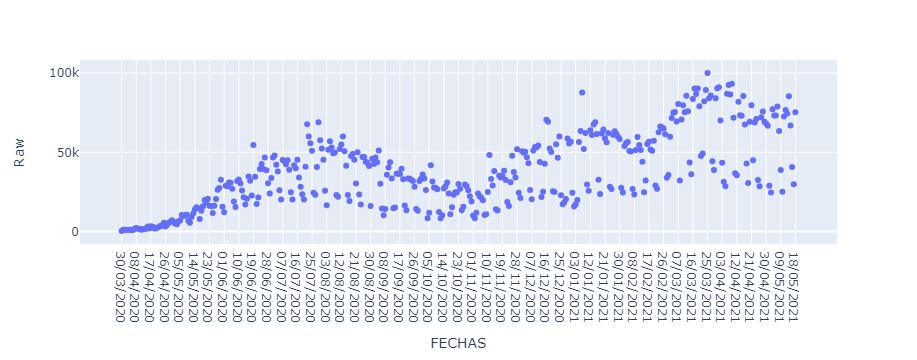

In [2]:
# Part 1 -Preprocessing

import time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import plotly.express          as     px
import plotly.graph_objects    as     go
from datetime                  import datetime
#from surprise                  import Dataset, Reader
from collections               import defaultdict

#np.random.seed(35)

def parser(s):
    return datetime.strptime(s, '%d/%m/%Y')

# Importing the training set
path = os.path.join('c:' + os.sep, 'Users', 'usuario', 'OneDrive', 'Software', '18 mayo', 'Casos_Diarios_BRA.csv')   
df = pd.read_csv(path)
#df = pd.read_csv(path, index_col='FECHA',parse_dates=True)

time_series = pd.Series(df['DIA'].values)
Fechas      = pd.Series(df['FECHA'].values)

COVID_Time_Series_df = pd.DataFrame(time_series.values,columns=['Raw'])
COVID_Time_Series_df['FECHAS'] = pd.DataFrame(Fechas.values)
fig = px.scatter(COVID_Time_Series_df, x='FECHAS',y='Raw')
fig.show()

#time_Series = np.array(time_series).reshape(-1,1)

#print('todo')
#print(df)

training_set = df.iloc[:, 1:2].values

#print('solo valores')
#print(training_set)

# Feature Scaling
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_set)
#print('escalado')
#print(training_set_scaled)

DF = pd.read_csv(path, parse_dates=[0], index_col=0, date_parser=parser)
time_series = DF.asfreq(pd.infer_freq(DF.index))

In [3]:
#Performance Indicators

def MAPE(Real: np.ndarray, Est: np.ndarray):
    Dif = np.zeros(int(len(Real)))
    for a in range(int(len(Real))):
        Dif[a] = (abs(Real[a] - Est[a])/abs(Real[a]))*100
    Mape = np.mean(Dif)    
    print(Mape)
    return Mape, Dif

def RMSE(Real: np.ndarray, Est: np.ndarray):
    Dif   = np.zeros(int(len(Real)))
    for a in range(int(len(Real))):
        Dif[a] = ((Est[a] - Real[a])**2)
    mse  = np.mean(Dif)
    rmse = np.sqrt(mse)    
    return rmse, mse

def mda(Real: np.ndarray, Pronos: np.ndarray):
    DifRe  = np.zeros(int(len(Real))-1)
    DifPro = np.zeros(int(len(Real))-1)
    Vmda = np.zeros(int(len(Real))-1)
    for a in range(int(len(Real))-1):
        DifRe[a] = Real[a] - Real[a+1]
        DifPro[a] = Pronos[a] - Pronos[a+1]
        Vmda[a] = (np.sign(DifRe[a]) == np.sign(DifPro[a]))
    mda = np.mean(Vmda)*100
    print(mda)
    return mda

def RMSEDD(Real: np.ndarray, Pronos: np.ndarray):
    DifRe  = np.zeros(int(len(Real))-1)
    DifPro = np.zeros(int(len(Real))-1)
    mse    = np.zeros(int(len(Real))-1)
    for a in range(int(len(Real))-1):
        DifRe[a]  = Real[a] - Real[a+1]
        DifPro[a] = Pronos[a] - Pronos[a+1]
        mse[a]    = (DifRe[a] - DifPro[a])**2

    MSEDD  = np.mean(mse)
    RMSEDD = np.sqrt(MSEDD)

    return RMSEDD, MSEDD

def Variance(actual: np.ndarray, predicted: np.ndarray):
    Dif    = np.mean(actual-predicted)
    DifVar = actual - predicted
    Var2   = np.mean(DifVar*DifVar)
    Var    = np.sqrt(Var2)
    print('Std Dev')
    print(Var)
    print('mean Diference')
    print(Dif)
    return Dif, Var

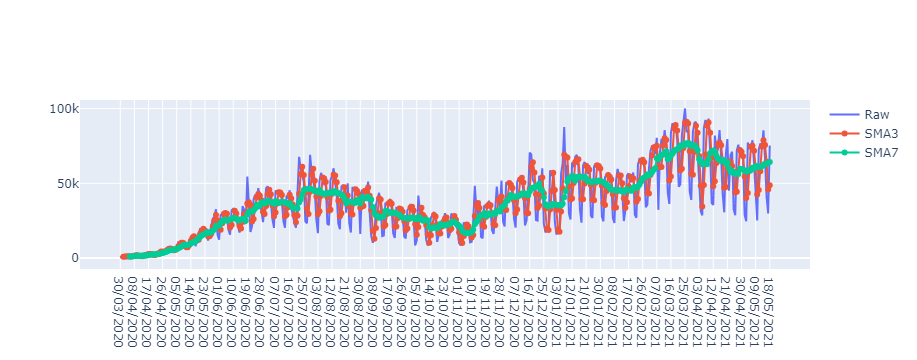

In [4]:
### Filtering

def SMA(data,n):
    sma = data.rolling(window=n).mean()
    return pd.DataFrame(sma)

sma = [3, 7]

for i in sma:
    COVID_Time_Series_df[f'SMA_{i}'] = SMA(COVID_Time_Series_df['Raw'], i)
    
COVID_Time_Series_df.tail()

Raw          = COVID_Time_Series_df['Raw']

#### SMA3
SMA3         = np.zeros(len(Raw))
sma3         = COVID_Time_Series_df['SMA_3']
SMA3[2:]     = sma3[2:]

#### SMA7
SMA7         = np.zeros(len(Raw))
sma7         = COVID_Time_Series_df['SMA_7']
SMA7[6:]     = sma7[6:]

fig = go.Figure()
# Add traces
fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['Raw'] ,
                        mode='lines', name='Raw'))

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['SMA_3'] ,
                        mode='lines+markers', name='SMA3'))

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['SMA_7'] ,
                        mode='lines+markers', name='SMA7'))

fig.show()



In [5]:
### Getting the Training set
#Scaling

SMA3 = np.reshape(SMA3, (-1,1))
SMA7 = np.reshape(SMA7, (-1,1))

training_set_scaled_sma3 = sc.fit_transform(SMA3)
training_set_scaled_sma7 = sc.fit_transform(SMA7)

lim_train    = 350  # Límite superior del entrenamiento
L_train      = 21   #Ancho de ventana de entrenamiento

X_train      = []
y_train      = []

X_train_sma3 = []
y_train_sma3 = []

X_train_sma7 = []
y_train_sma7 = []

for i in range(L_train, lim_train):
    X_train.append(training_set_scaled[i-L_train:i, 0])
    X_train_sma3.append(training_set_scaled_sma3[i-L_train:i, 0])
    X_train_sma7.append(training_set_scaled_sma7[i-L_train:i, 0])
    y_train.append(training_set_scaled[i, 0])
    y_train_sma3.append(training_set_scaled_sma3[i, 0])
    y_train_sma7.append(training_set_scaled_sma7[i, 0])
    
X_train, y_train           = np.array(X_train), np.array(y_train)
X_train_sma3, y_train_sma3 = np.array(X_train_sma3), np.array(y_train_sma3)
X_train_sma7, y_train_sma7 = np.array(X_train_sma7), np.array(y_train_sma7)

print(X_train.shape)
print(y_train.shape)
#print(X_train)
#print(y_train)

# Getting the Validation set

Size_Val        = 42
Validation      = training_set_scaled[lim_train:lim_train + Size_Val]
Validation_sma3 = training_set_scaled_sma3[lim_train:lim_train + Size_Val]
Validation_sma7 = training_set_scaled_sma7[lim_train:lim_train + Size_Val]

X_val      = []
y_val      = []
X_val_sma3 = []
y_val_sma3 = []
X_val_sma7 = []
y_val_sma7 = []
    
### Validación del tamaño de validación.     
for i in range(lim_train, lim_train + Size_Val):
    X_val.append(training_set_scaled[i - L_train:i, 0])
    y_val.append(training_set_scaled[i, 0])
    X_val_sma3.append(training_set_scaled_sma3[i - L_train:i, 0])
    y_val_sma3.append(training_set_scaled_sma3[i, 0])
    X_val_sma7.append(training_set_scaled_sma7[i - L_train:i, 0])
    y_val_sma7.append(training_set_scaled_sma7[i, 0])
    
X_val, y_val           = np.array(X_val), np.array(y_val)
X_val_sma3, y_val_sma3 = np.array(X_val_sma3), np.array(y_val_sma3)
X_val_sma7, y_val_sma7 = np.array(X_val_sma7), np.array(y_val_sma7)

print('X_val')
print(X_val.shape)
#print(X_val)
print('y_val')
print(y_val.shape)
#print(y_val)
print('Validación Real')
#print(training_set_scaled[lim_train:lim_train + Size_Val])

# Reshaping
X_train      = np.reshape(X_train,      (X_train.shape[0], X_train.shape[1], 1))
X_val        = np.reshape(X_val,        (X_val.shape[0],X_val.shape[1], 1))
X_train_sma3 = np.reshape(X_train_sma3, (X_train.shape[0], X_train.shape[1], 1))
X_val_sma3   = np.reshape(X_val_sma3,   (X_val.shape[0],X_val.shape[1], 1))
X_train_sma7 = np.reshape(X_train_sma7, (X_train.shape[0], X_train.shape[1], 1))
X_val_sma7   = np.reshape(X_val_sma7,   (X_val.shape[0],X_val.shape[1], 1))
#print(X_train.shape)

#print('Validación')
#print(Validation)

(329, 21)
(329,)
X_val
(42, 21)
y_val
(42,)
Validación Real


In [6]:
import matplotlib.pyplot           as plt

# Part 2 - Building the RNN

# Importing the Keras libraries and packages
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
def model_lstm(opt):
    regressor = Sequential()
    # Adding the first LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True, input_shape = (X_train.shape[1], 1))) #(L, 1)
    regressor.add(Dropout(0.3))
    # Adding a second LSTM layer nd some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a second LSTM layer nd some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a third LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a third LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a third LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a fourth LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21))
    regressor.add(Dropout(0.3))
    # Adding the output layer
    regressor.add(Dense(units = 1))
    regressor.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['mse'])
    
    return regressor

def model_lstm2(opt):
    regressor = Sequential()
    # Adding the first LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True, input_shape = (X_train.shape[1], 1))) #(L, 1)
    regressor.add(Dropout(0.3))
    # Adding a second LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21))
    regressor.add(Dropout(0.3))
    # Adding the output layer
    regressor.add(Dense(units = 1))
    regressor.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['mse'])
    
    return regressor


def AddNewValue(x_test, NewValue):
    x_test_copy = np.copy(x_test)
    for i in range(x_test.shape[1]-1):
        x_test[0][i][0] = x_test_copy[0][i+1][0]
        x_test[0][x_test.shape[1]-1][0]=NewValue
        
    return x_test

def lstm_validation_results(X_train, y_train, X_val, y_val, mode):
    model = mode
    history = model.fit(X_train, y_train, epochs = epochs, validation_data=(X_val, y_val), batch_size = batch_size, verbose=False)
    plt.ion()
    plt.plot(history.history['mse'])
    plt.plot(history.history['val_mse']) #val_mse
    plt.ylim(0,0.1)
    plt.grid()
    plt.show()
        
    MSE     = (history.history['mse'])
    VAL_MSE = (history.history['val_mse'])

#    # Guardamos los datos en len(RNN)
#    all_mse.append(MSE[:])
#    all_val_mse.append(VAL_MSE[:]) 
    #print(all_mse) 
    fcast_val = model.predict(X_val)
    #all_fcast_val.append(prediction)
    
    return model, np.array(fcast_val), np.array(MSE), np.array(VAL_MSE)   

def lstm_test_results(model, X_super_train, y_super_train):
    results = []
    x_history_fcast = X_super_train[-1:, ].copy() #Todos menos el último
    x_history_fcast = AddNewValue(x_history_fcast, y_super_train[-1:, ].copy())    
   
    for i in range(int(Steps_Fcast)):  
        #print(x_history_fcast)
        parcial = model.predict(x_history_fcast)
        results.append(parcial[0][0])
        x_history_fcast = AddNewValue(x_history_fcast, parcial[0][0])
        
    return np.array(results)
    
    

In [7]:
def model_lstm53(opt):
    regressor = Sequential()
    # Adding the first LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True, input_shape = (X_train.shape[1], 1))) #(L, 1)
    regressor.add(Dropout(0.3))
    # Adding a second LSTM layer nd some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a third LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a third LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a fourth LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21))
    regressor.add(Dropout(0.3))
    # Adding the output layer
    regressor.add(Dense(units = 1))
    regressor.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['mse'])
    
    return regressor

def model_lstm43(opt):
    regressor = Sequential()
    # Adding the first LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True, input_shape = (X_train.shape[1], 1))) #(L, 1)
    regressor.add(Dropout(0.3))
    # Adding a second LSTM layer nd some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a fourth LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21))
    regressor.add(Dropout(0.3))
    # Adding a fourth LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21))
    regressor.add(Dropout(0.3))
    # Adding the output layer
    regressor.add(Dense(units = 1))
    regressor.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['mse'])
    
    return regressor

def model_lstm33(opt):
    regressor = Sequential()
    # Adding the first LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True, input_shape = (X_train.shape[1], 1))) #(L, 1)
    regressor.add(Dropout(0.3))
    # Adding a second LSTM layer nd some Dropout regularisation
    regressor.add(LSTM(units = 42, return_sequences = True))
    regressor.add(Dropout(0.3))
    # Adding a fourth LSTM layer and some Dropout regularisation
    regressor.add(LSTM(units = 21))
    regressor.add(Dropout(0.3))
    # Adding the output layer
    regressor.add(Dense(units = 1))
    regressor.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['mse'])
    
    return regressor

In [8]:
def Better_LSTM(X_train, y_train, X_val, y_val, Bestof, mode):
    #Creamos los vectores vacios para los pronósticos realizados (fcas_val) y para la métrica (mse)
    all_fcast_val  = []
    all_mse        = []  
    all_val_mse    = []   
    all_fcast_test = []
    rnn            = 0
    
    for run in range(0, Bestof): 
#        #regressor.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['mse'])
#        # Fitting the RNN to the Training set
#        model = model_lstm(opt='adam')
#        history = regressor.fit(X_train, y_train, epochs = epochs, validation_data=(X_val, y_val), batch_size = batch_size, verbose=False)
#        plt.ion()
#        plt.plot(history.history['mse'])
#        plt.plot(history.history['val_mse']) #val_mse
#        plt.ylim(0,0.005)
#        plt.grid()
#        plt.show()
#        
#        MSE     = (history.history['mse'])
#        VAL_MSE = (history.history['val_mse'])#
#
#        # Guardamos los datos en len(RNN)
#        all_mse.append(MSE[:])
#        all_val_mse.append(VAL_MSE[:]) 
#        #print(all_mse) 
#        prediction = regressor.predict(X_val)
#        all_fcast_val.append(prediction)
        
        regressor, fcast_val, mse, val_mse = lstm_validation_results(X_train, y_train, X_val, y_val, mode)
        # Guardamos los datos en len(RNN)
        all_mse.append(mse[:])
        all_val_mse.append(val_mse[:]) 
        all_fcast_val.append(fcast_val)
        
        X = np.concatenate((X_train, X_val), axis=0)
        y = np.concatenate((y_train, y_val), axis=0)
        fc_test = lstm_test_results(regressor, X, y)
        all_fcast_test.append(fc_test) 
        del(regressor)
       
        rnn = rnn + 1
        print('Bestof')
        print(rnn)
        #print(regressor)
        #del regressor          ###Este es para borrar todo el progreso y volver a empezar.
        #print(regressor)
        #history = []
        #regressor = []

    #Reordenamos.    
    arramseval    = np.array(all_val_mse).reshape(-1,epochs)#val_mse
    arramse       = np.array(all_mse).reshape(-1,epochs)
  
    #We isolate the last file to get the best Final mse.
    mse_final     = arramse[:,epochs-1]
    mse_final_val = arramseval[:,epochs-1]
    #print('mse final')
    #print(mse_final)
    #Getting the position
    #pos_bestmse = np.where(arramse == np.amin(arramse))                    # mejor global
    #pos_bestmseval = np.where(arramseval == np.amin(arramseval))           #val_mse global
    pos_bestmsef      = np.where(mse_final == np.amin(mse_final))           #mejor final
    pos_bestmsevalf   = np.where(mse_final_val == np.amin(mse_final_val))   #val_mse final
    #print('Posiciones del mejor mse y mse final')
    #print(pos_bestmse)
    #print(pos_bestmsefinal)
    posbestmsef_train = np.array(pos_bestmsef[0])    #Convirtiendo dato
    posbestmsef_val   = np.array(pos_bestmsevalf[0]) #Convirtiendo dato
    #print('Posiciones arrary mse y mse final')
    #print(posbestmse)
    #print(posbestmsef)
    Sposbestmsef_train = posbestmsef_train.item()    #Convirtiendo dato
    Sposbestmsef_val   = posbestmsef_val.item()      #Convirtiendo dato
    ### The both best mse final and global
    #print('Todos los pronósticos de validación')
    #print(all_fcast_val)
    #print('Todos los pronósticos de test')
    #print(all_fcast_test)
    bestValmse_train  = np.array(all_fcast_val[Sposbestmsef_train]).T  #De la matriz de pronósticos de validación se toma la posición elegida
    bestValmse_val    = np.array(all_fcast_val[Sposbestmsef_val]).T    #De la matriz de pronósticos de validación se toma la posición elegida
    bestTestmse_train = np.array(all_fcast_test[Sposbestmsef_train]).T #De la matriz de pronósticos de test se toma la posición elegida
    bestTestmse_val   = np.array(all_fcast_test[Sposbestmsef_val]).T   #De la matriz de pronósticos de test se toma la posición elegida
                                                                      
    return bestValmse_train, bestTestmse_train, bestValmse_val, bestTestmse_val, all_mse, all_val_mse

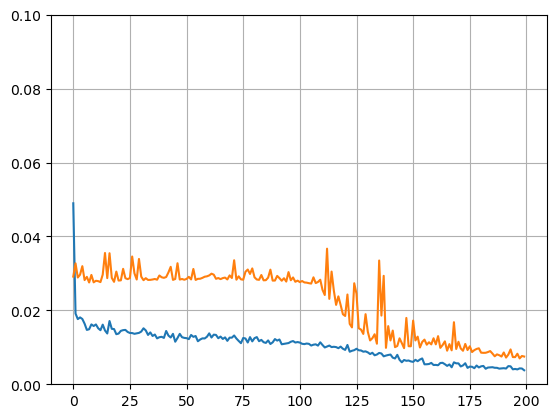

Bestof
1


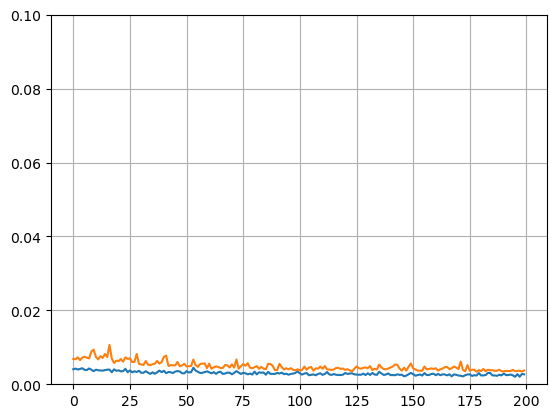

Bestof
2


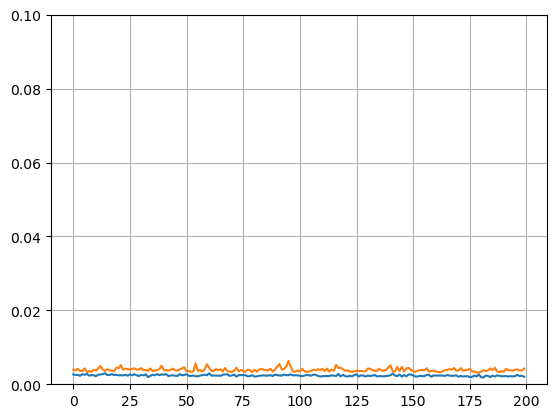

Bestof
3


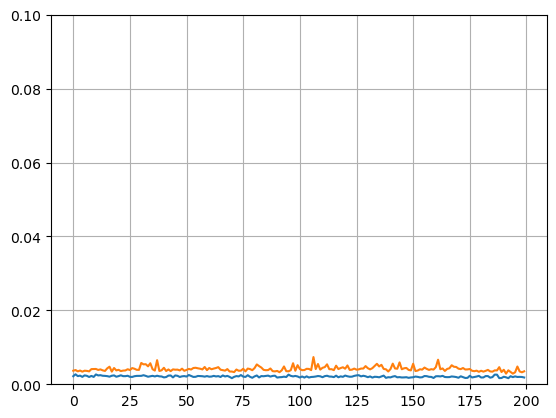

Bestof
4


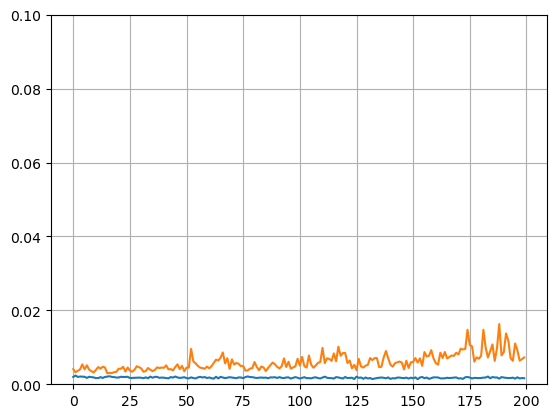

Bestof
5


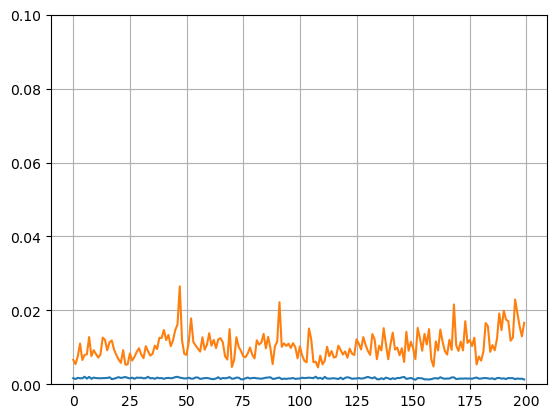

Bestof
6


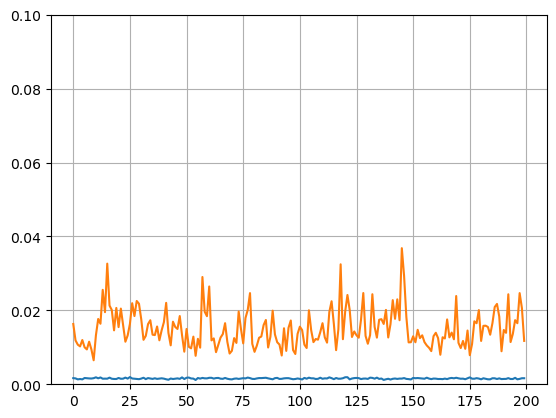

Bestof
7


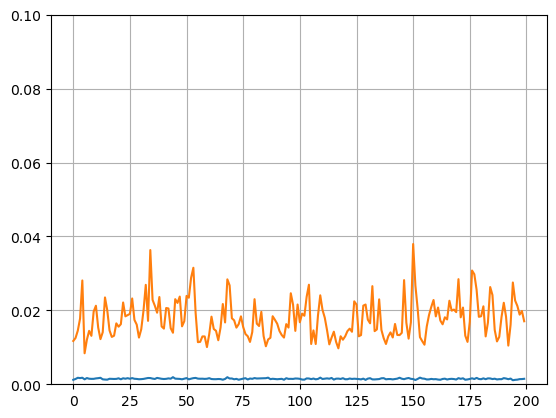

Bestof
8


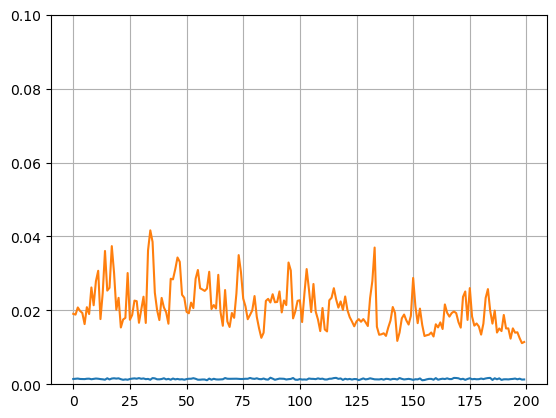

Bestof
9


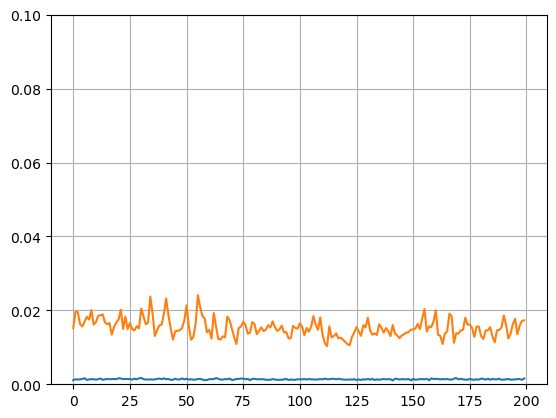

Bestof
10


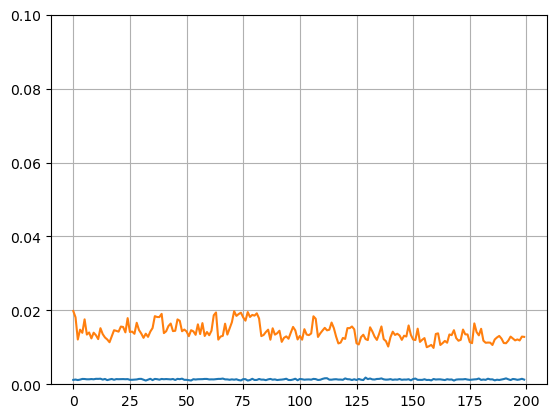

Bestof
11


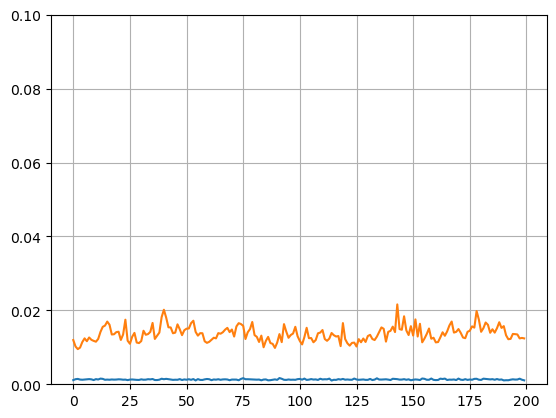

Bestof
12


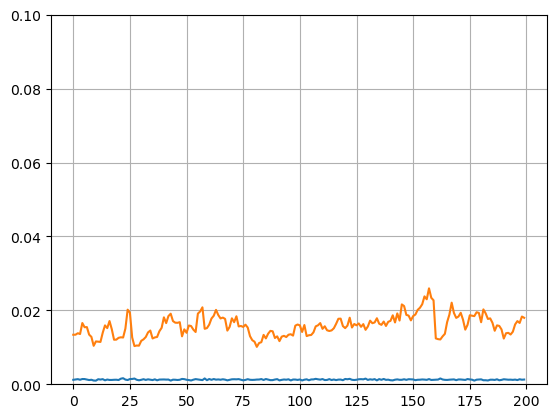

Bestof
13


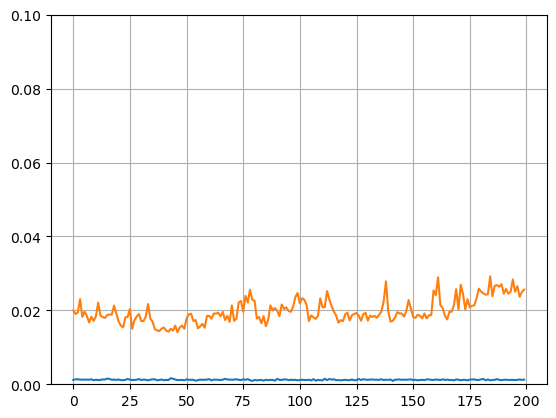

Bestof
14


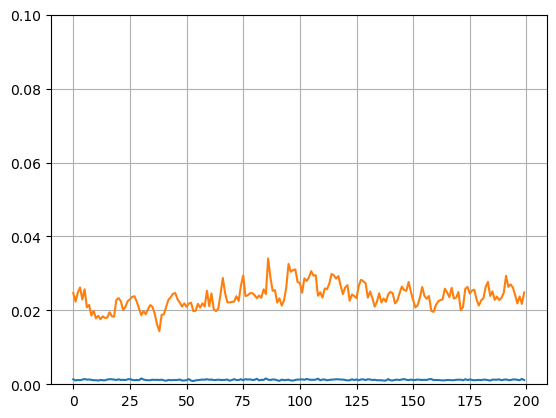

Bestof
15


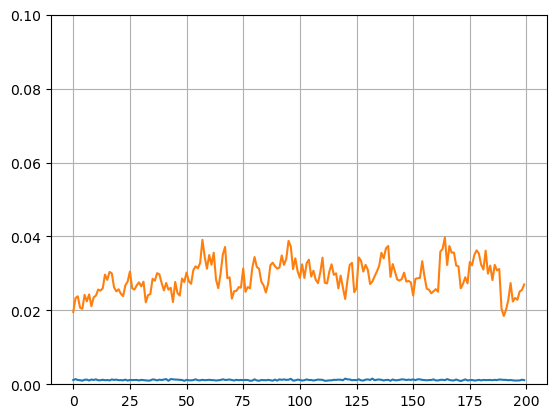

Bestof
16


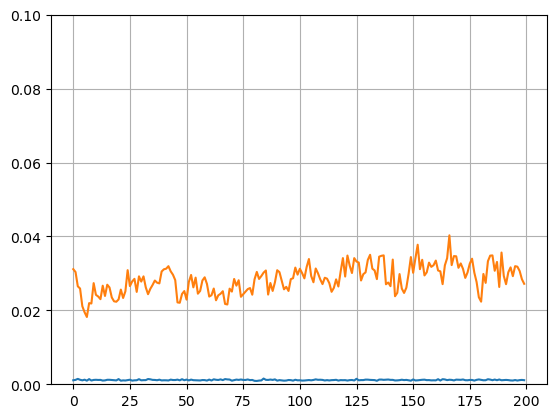

Bestof
17


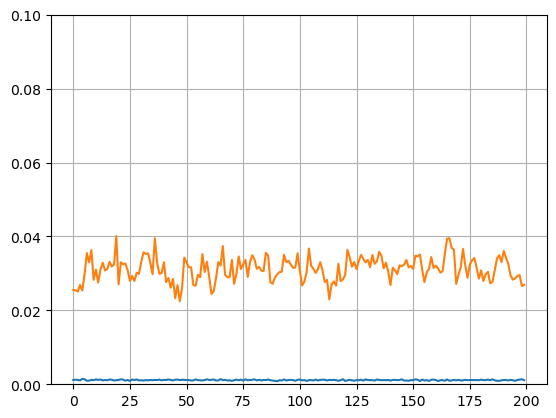

Bestof
18


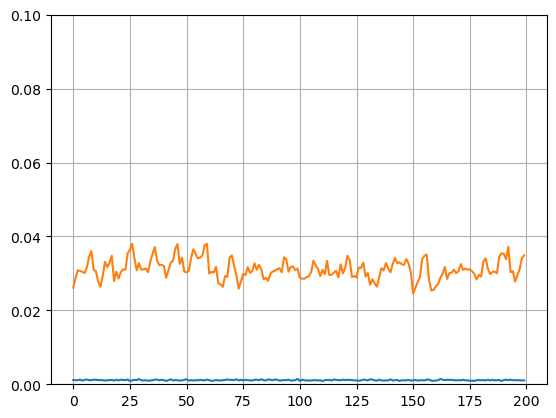

Bestof
19


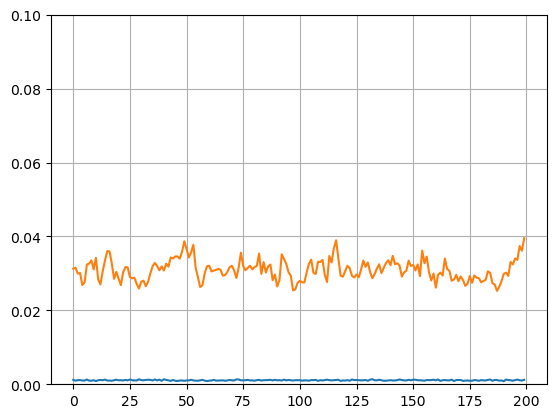

Bestof
20
Repetición
1


In [8]:
### SMA3

Bestof      = 20
Steps_Fcast = 21
Repes       = 1
batch_size  = 21
epochs      = 200

A_mse = []
Aval_mse = [] #val_mse

all_Fcast_sma3_Val_train  = []
all_Fcast_sma3_Val_val    = []
all_Fcast_sma3_Test_train = []
all_Fcast_sma3_Test_val   = []

#Modos, para pronóstico de filtro sma3 usar:
mode = model_lstm2(opt='adam')
#Modos, para pronóstico de residuos usar:
#mode = model_lstm2(opt='adam')

Rep = 0

for run in range(0,Repes):
    FcastVal_train, FcastTest_train, FcastVal_val, FcastTest_val, all_mse, all_val_mse = Better_LSTM(X_train_sma3, y_train_sma3, X_val_sma3, y_val_sma3, Bestof, mode)
    
    all_Fcast_sma3_Val_train.append(FcastVal_train[:])
    all_Fcast_sma3_Test_train.append(FcastTest_train[:])
    all_Fcast_sma3_Val_val.append(FcastVal_val[:])
    all_Fcast_sma3_Test_val.append(FcastTest_val[:])
    Rep = Rep + 1
    print('Repetición')
    print(Rep)

In [9]:
### SMA3

### Promediando todos los repes pronósticos.
avg_Fcast_sma3_Val_train  = np.mean(all_Fcast_sma3_Val_train, axis=0)
avg_Fcast_sma3_Test_train = np.mean(all_Fcast_sma3_Test_train, axis=0)
avg_Fcast_sma3_Val_val    = np.mean(all_Fcast_sma3_Val_val, axis=0)
avg_Fcast_sma3_Test_val   = np.mean(all_Fcast_sma3_Test_val, axis=0)

### Poniendolos en un vector de uno porque el inverse no puede
avg_Fcast_sma3_Val_train    = np.array(avg_Fcast_sma3_Val_train).reshape(-1,1)
avg_Fcast_sma3_Test_train   = np.array(avg_Fcast_sma3_Test_train).reshape(-1,1)
avg_Fcast_sma3_Val_val      = np.array(avg_Fcast_sma3_Val_val).reshape(-1,1)
avg_Fcast_sma3_Test_val     = np.array(avg_Fcast_sma3_Test_val).reshape(-1,1)


### Desescalando los pronósticos.
fc_sma3_val_train  = sc.inverse_transform(avg_Fcast_sma3_Val_train)
fc_sma3_test_train = sc.inverse_transform(avg_Fcast_sma3_Test_train)
fc_sma3_val_val    = sc.inverse_transform(avg_Fcast_sma3_Val_val)
fc_sma3_test_val   = sc.inverse_transform(avg_Fcast_sma3_Test_val)

Val_sma3_df        = pd.DataFrame(SMA3[lim_train:lim_train + Size_Val])
Val_sma3           = np.array(Val_sma3_df)
Test_sma3_df       = pd.DataFrame(SMA3[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test_sma3          = np.array(Test_sma3_df)

### Métricas de Desempeño
print('Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Val_sma3, fc_sma3_val_train)
print('MDA')
MDA = mda(Val_sma3, fc_sma3_val_train)
print(MDA)
print('RMSE')
rmse = RMSE(Val_sma3, fc_sma3_val_train)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Test_sma3, fc_sma3_test_train)
print('MDA')
MDA = mda(Test_sma3, fc_sma3_test_train)
print(MDA)
print('RMSE')
rmse = RMSE(Test_sma3, fc_sma3_test_train)
print(rmse[0])

print('Medidas de error del pronóstico de Validación según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Val_sma3, fc_sma3_val_val)
print('MDA')
MDA = mda(Val_sma3, fc_sma3_val_val)
print(MDA)
print('RMSE')
rmse = RMSE(Val_sma3, fc_sma3_val_val)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Test_sma3, fc_sma3_test_val)
print('MDA')
MDA = mda(Test_sma3, fc_sma3_test_val)
print(MDA)
print('RMSE')
rmse = RMSE(Test_sma3, fc_sma3_test_val)
print(rmse[0])

Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento
MAPE
23.38364884783436
MDA
53.65853658536586
53.65853658536586
RMSE
18466.171551558404
Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento
MAPE
25.232052562933877
MDA
45.0
45.0
RMSE
20340.549317328736
Medidas de error del pronóstico de Validación según el mejor mse de validación
MAPE
13.449443938769015
MDA
85.36585365853658
85.36585365853658
RMSE
11207.785612614956
Medidas de error del pronóstico de Prueba según el mejor mse de validación
MAPE
15.07580865615856
MDA
80.0
80.0
RMSE
11493.616773310081


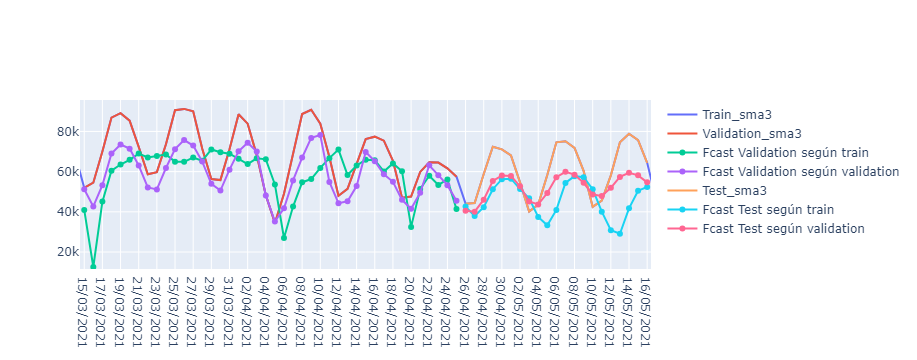

In [10]:
### SMA3
# Part 5 - Visualising the Forecast 

Fcast_df                          = pd.DataFrame(Val_sma3_df.values, columns=['Validation_sma3'])
Fechas_validation_df              = pd.DataFrame(Fechas[lim_train:lim_train + Size_Val])
Fcast_df['FechasValidation']      = pd.DataFrame(Fechas_validation_df.values)
Fcast_df['Fcast_sma3_Val_train']  = pd.DataFrame(fc_sma3_val_train)
Fcast_df['Fcast_sma3_Val_val']    = pd.DataFrame(fc_sma3_val_val)

Fcast_df['Test_sma3']             = pd.DataFrame(Test_sma3_df.values)
Fcast_df['Fcast_sma3_Test_train'] = pd.DataFrame(fc_sma3_test_train)
Fcast_df['Fcast_sma3_Test_val']   = pd.DataFrame(fc_sma3_test_val)
Fechas_test_df                    = pd.DataFrame(Fechas[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Fcast_df['FechasTest']            = pd.DataFrame(Fechas_test_df.values)

fig = go.Figure()
# Add traces
#fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['Raw'] ,
#                        mode='lines', name='Real'))
fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['SMA_3'] ,
                        mode='lines', name='Train_sma3'))

fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Validation_sma3'],
                        mode='lines', name='Validation_sma3'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_sma3_Val_train'],
                        mode='lines+markers', name='Fcast Validation según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_sma3_Val_val'],
                        mode='lines+markers', name='Fcast Validation según validation'))

fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Test_sma3'],
                        mode='lines', name='Test_sma3'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_sma3_Test_train'],
                        mode='lines+markers', name='Fcast Test según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_sma3_Test_val'],
                        mode='lines+markers', name='Fcast Test según validation'))

fig.show()


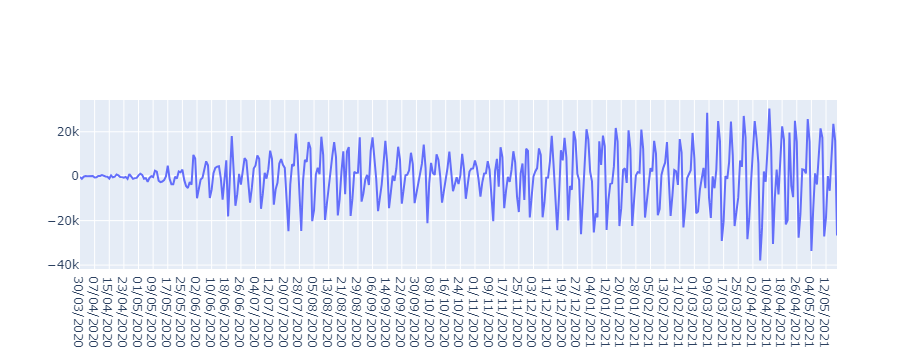

In [11]:
###SMA3 RESIDUES

ResSMA3_df = pd.DataFrame(SMA3 - time_series)
ResSMA3 = ResSMA3_df.to_numpy()

### Visualización
COVID_Time_Series_df['RSMA3'] = pd.DataFrame(ResSMA3_df.values)

# Add traces
fig = go.Figure()

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'], y=COVID_Time_Series_df['RSMA3'], mode='lines',name='All the Residuals'))

fig.show()

In [12]:
###SMA3 RESIDUES

residual_set_scaled_sma3 = sc.fit_transform(ResSMA3)

X_train_sma3 = []
y_train_sma3 = []

for i in range(L_train, lim_train):
    X_train_sma3.append(residual_set_scaled_sma3[i - L_train : i, 0])
   
    y_train_sma3.append(residual_set_scaled_sma3[i, 0])
    
X_train_sma3, y_train_sma3 = np.array(X_train_sma3), np.array(y_train_sma3)

# Getting the Validation set
Validation_sma3 = residual_set_scaled_sma3[lim_train:lim_train + Size_Val]

X_val_sma3 = []
y_val_sma3 = []
    
### Validación del tamaño de validación.     
for i in range(lim_train, lim_train + Size_Val):
    X_val_sma3.append(residual_set_scaled_sma3[i - L_train:i, 0])
    y_val_sma3.append(residual_set_scaled_sma3[i, 0])

X_val_sma3, y_val_sma3 = np.array(X_val_sma3), np.array(y_val_sma3)

# Reshaping
X_train_sma3 = np.reshape(X_train_sma3, (X_train.shape[0], X_train.shape[1], 1))
X_val_sma3   = np.reshape(X_val_sma3,   (X_val.shape[0],X_val.shape[1], 1))

print(X_train_sma3.shape)
print(y_train_sma3.shape)
print(X_val_sma3.shape)
print(y_val_sma3.shape)
#print(X_val_sma3)
print(y_val_sma3)


(329, 21, 1)
(329,)
(42, 21, 1)
(42,)
[0.7846739  0.12873206 0.2593195  0.55629684 0.53725609 0.64732236
 0.91405851 0.69172482 0.22685282 0.32406781 0.41517611 0.65759268
 0.61611695 0.95089336 0.80936844 0.13993251 0.27362198 0.51766505
 0.7551242  0.91627912 0.8023706  0.64040244 0.         0.21645589
 0.58521347 0.51788419 0.73139874 1.         0.73702331 0.10901928
 0.41101247 0.59897053 0.43523465 0.66940672 0.88210802 0.79454977
 0.23777082 0.26554305 0.84131893 0.49115408 0.41655913 0.91906949]


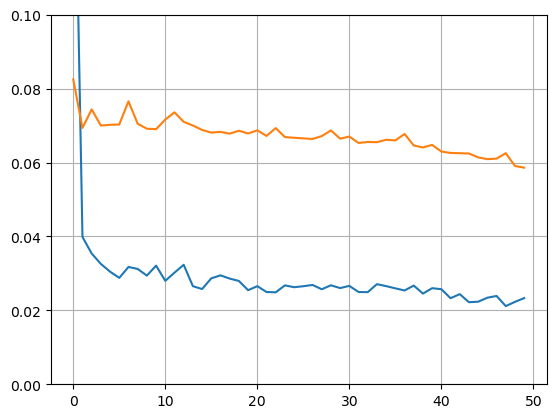

Bestof
1


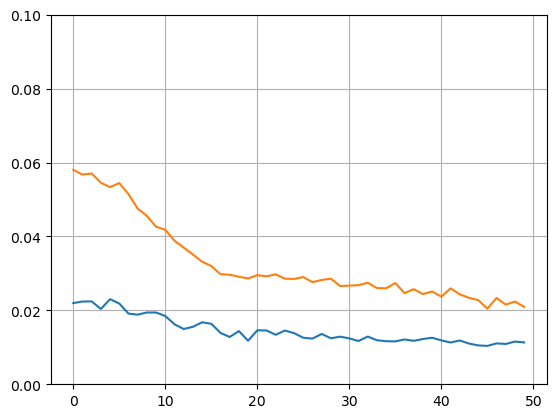

Bestof
2


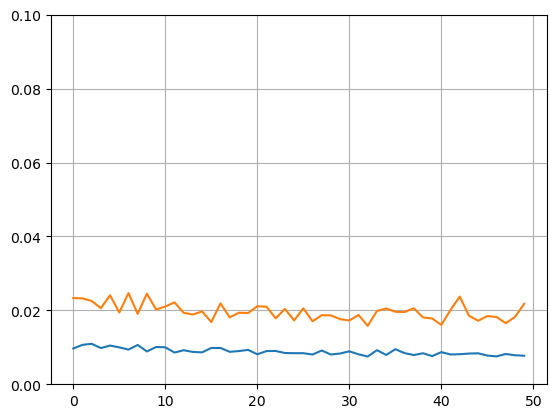

Bestof
3


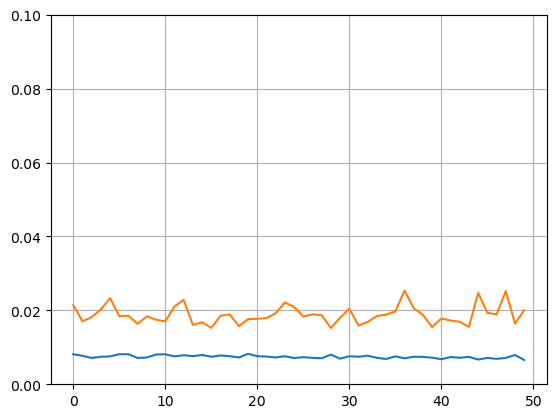

Bestof
4


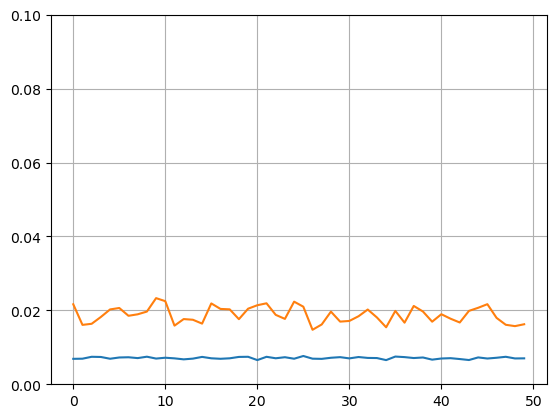

Bestof
5


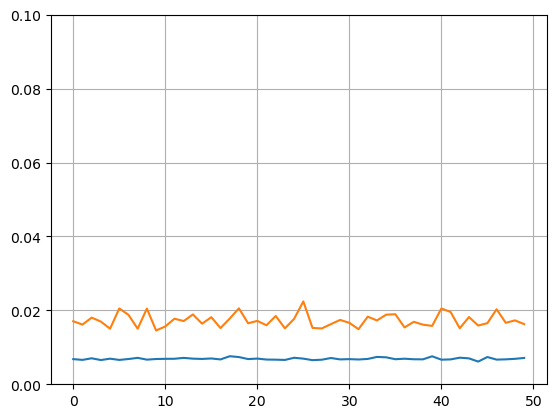

Bestof
6


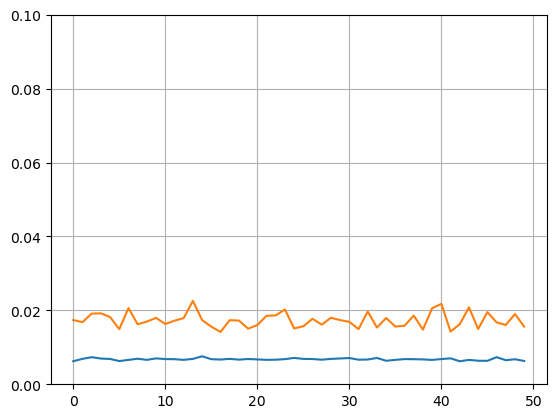

Bestof
7


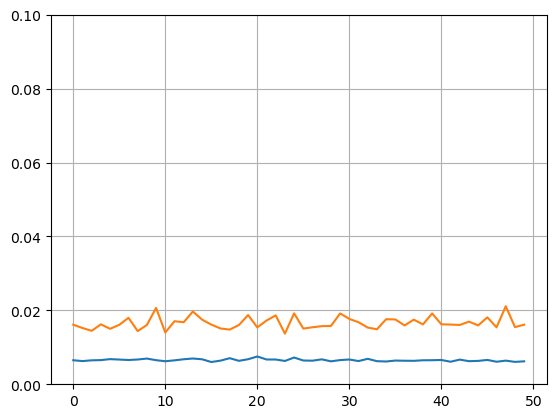

Bestof
8


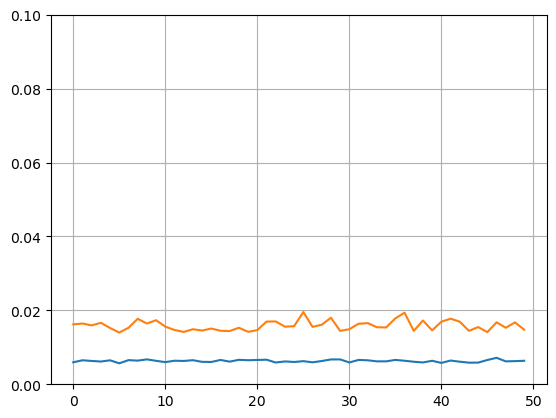

Bestof
9


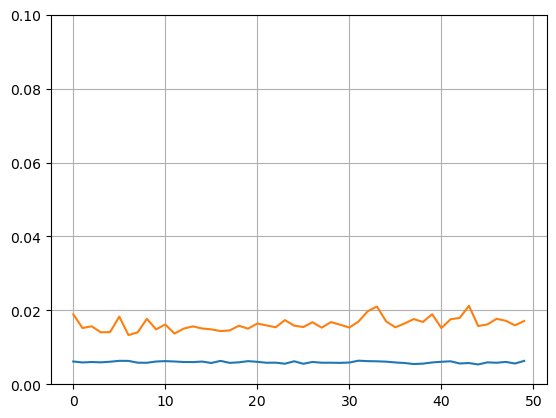

Bestof
10


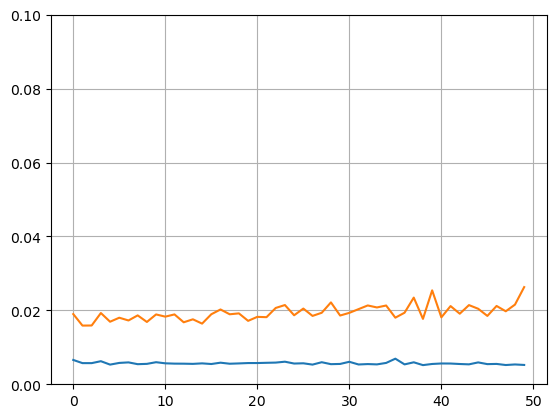

Bestof
11


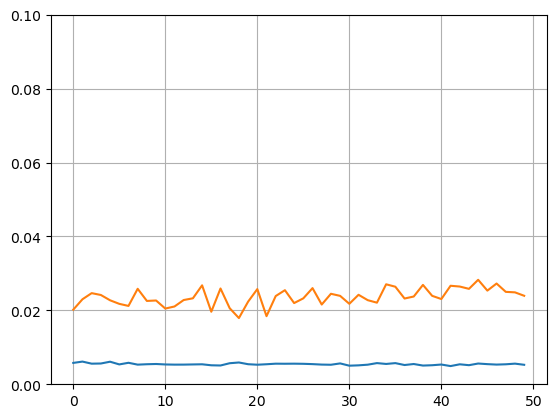

Bestof
12


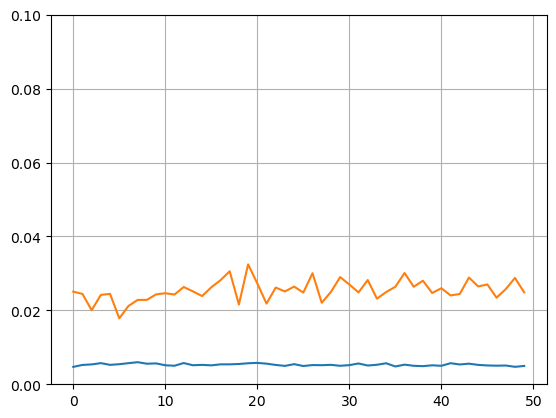

Bestof
13


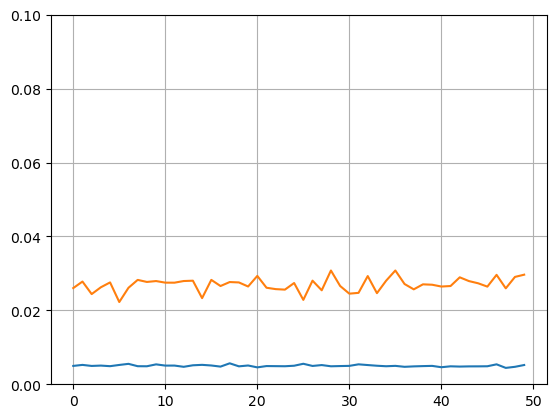

Bestof
14


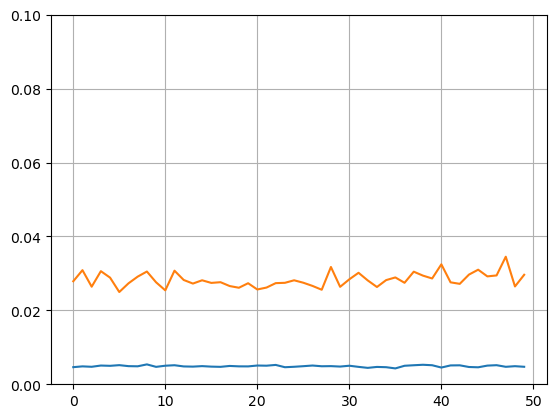

Bestof
15


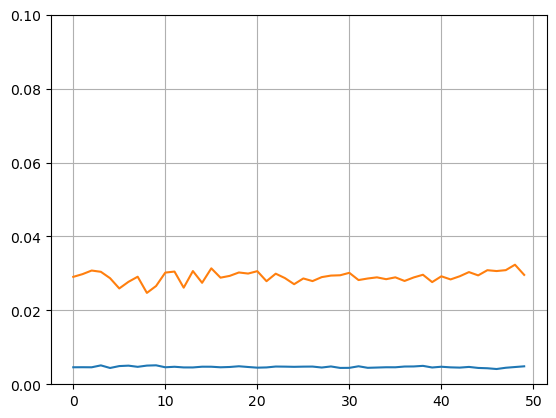

Bestof
16


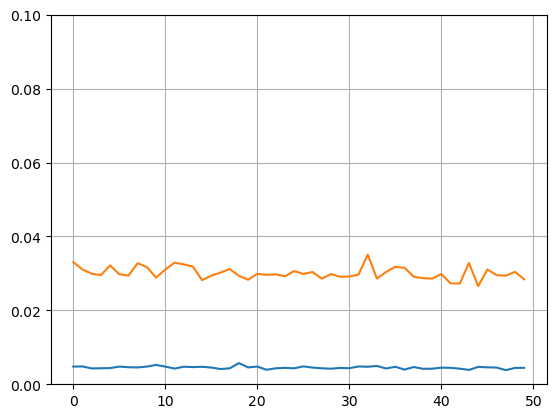

Bestof
17


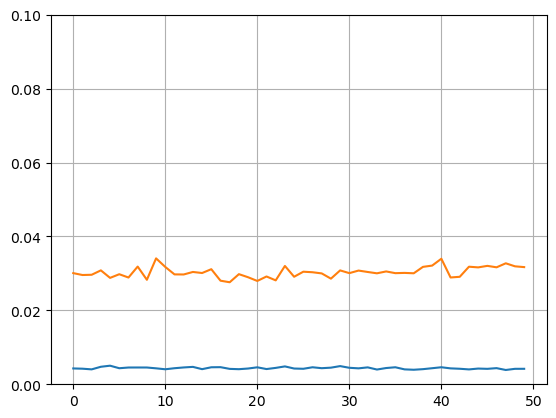

Bestof
18


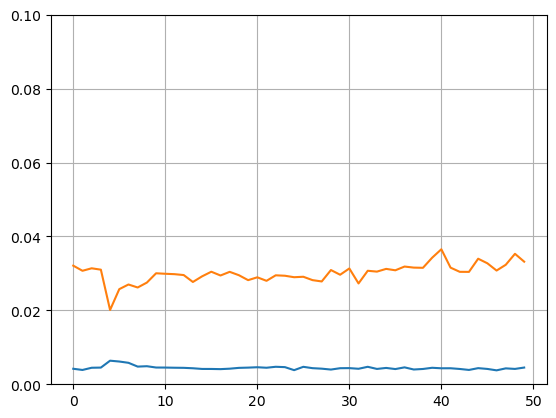

Bestof
19


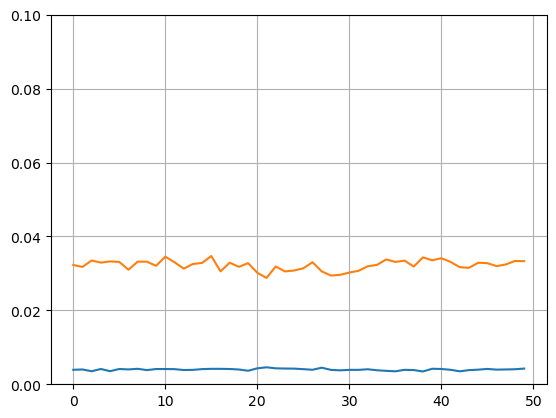

Bestof
20
Repetición
1


In [13]:
###SMA3 RESIDUES

Bestof      = 20
Repes       = 1
batch_size  = 14
epochs      = 50

A_mse = []
Aval_mse = [] #val_mse

all_FcastVal_train  = []
all_FcastVal_val    = []
all_FcastTest_train = []
all_FcastTest_val   = []

#Modos, para pronóstico de filtro sma3 usar:
#mode = model_lstm(opt='adam')
#Modos, para pronóstico de residuos usar:
mode = model_lstm2(opt='adam')

Rep = 0

for run in range(0,Repes):
    FcastVal_train, FcastTest_train, FcastVal_val, FcastTest_val, all_mse, all_val_mse = Better_LSTM(X_train_sma3, y_train_sma3, X_val_sma3, y_val_sma3, Bestof, mode)
    
    all_FcastVal_train.append(FcastVal_train[:])
    all_FcastTest_train.append(FcastTest_train[:])
    all_FcastVal_val.append(FcastVal_val[:])
    all_FcastTest_val.append(FcastTest_val[:])
    Rep = Rep + 1
    print('Repetición')
    print(Rep)

In [14]:
###SMA3 RESIDUES

### Promediando todos los repes pronósticos.
avg_FcastVal_train  = np.mean(all_FcastVal_train, axis=0)
avg_FcastTest_train = np.mean(all_FcastTest_train, axis=0)
avg_FcastVal_val    = np.mean(all_FcastVal_val, axis=0)
avg_FcastTest_val   = np.mean(all_FcastTest_val, axis=0)

### Poniendolos en un vector de uno porque el inverse no puede
avg_FcastVal_train    = np.array(avg_FcastVal_train).reshape(-1,1)
avg_FcastTest_train   = np.array(avg_FcastTest_train).reshape(-1,1)
avg_FcastVal_val      = np.array(avg_FcastVal_val).reshape(-1,1)
avg_FcastTest_val     = np.array(avg_FcastTest_val).reshape(-1,1)


### Desescalando los pronósticos.
fc_val_train  = sc.inverse_transform(avg_FcastVal_train)
fc_test_train = sc.inverse_transform(avg_FcastTest_train)
fc_val_val    = sc.inverse_transform(avg_FcastVal_val)
fc_test_val   = sc.inverse_transform(avg_FcastTest_val)

Val_df        = pd.DataFrame(ResSMA3[lim_train:lim_train + Size_Val])
Val           = np.array(Val_df)
Test_df       = pd.DataFrame(ResSMA3[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test          = np.array(Test_df)

### Métricas de Desempeño
print('Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Val, fc_val_train)
print('MDA')
MDA = mda(Val, fc_val_train)
print('RMSE')
rmse = RMSE(Val, fc_val_train)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Test, fc_test_train)
print('MDA')
MDA = mda(Test, fc_test_train)
print('RMSE')
rmse = RMSE(Test, fc_test_train)
print(rmse[0])

print('Medidas de error del pronóstico de Validación según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Val, fc_val_val)
print('MDA')
MDA = mda(Val, fc_val_val)
print('RMSE')
rmse = RMSE(Val, fc_val_val)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Test, fc_test_val)
print('MDA')
MDA = mda(Test, fc_test_val)
print('RMSE')
rmse = RMSE(Test, fc_test_val)
print(rmse[0])

Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento
MAPE
165.7991498534913
MDA
70.73170731707317
RMSE
12187.316081361036
Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento
MAPE
208.65377117952102
MDA
85.0
RMSE
9591.958968910654
Medidas de error del pronóstico de Validación según el mejor mse de validación
MAPE
102.72171703241433
MDA
78.04878048780488
RMSE
8317.61480790563
Medidas de error del pronóstico de Prueba según el mejor mse de validación
MAPE
135.82733304129007
MDA
80.0
RMSE
7240.869353614941


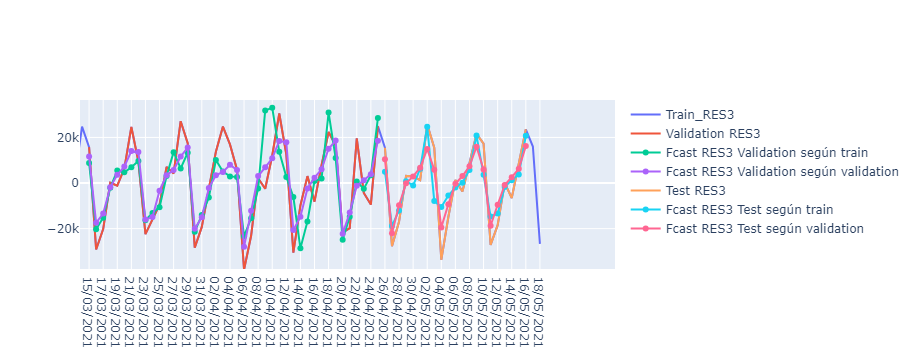

In [15]:
###SMA3 RESIDUES
# Part 5 - Visualising the Forecast 

Fcast_df['Validation_RES3']        = pd.DataFrame(Val_df.values)

Fcast_df['Fcast_RES3_Val_train']   = pd.DataFrame(fc_val_train)
Fcast_df['Fcast_RES3_Val_val']     = pd.DataFrame(fc_val_val)

Fcast_df['Test_RES3']              = pd.DataFrame(Test_df.values)
Fcast_df['Fcast_RES3_Test_train']  = pd.DataFrame(fc_test_train)
Fcast_df['Fcast_RES3_Test_val']    = pd.DataFrame(fc_test_val)

fig = go.Figure()
# Add traces

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['RSMA3'], mode='lines', name='Train_RES3'))
                        

fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Validation_RES3'],mode='lines', name='Validation RES3'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES3_Val_train'], mode='lines+markers', name='Fcast RES3 Validation según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES3_Val_val'], mode='lines+markers', name='Fcast RES3 Validation según validation'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Test_RES3'], mode='lines', name='Test RES3'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_RES3_Test_train'], mode='lines+markers', name='Fcast RES3 Test según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_RES3_Test_val'], mode='lines+markers', name='Fcast RES3 Test según validation'))

fig.show()

Mape del Pronóstico Total
23.246846143836738
65.0
Promedio de la Presición de la Dirección
65.0
RMSE
14785.290113902414


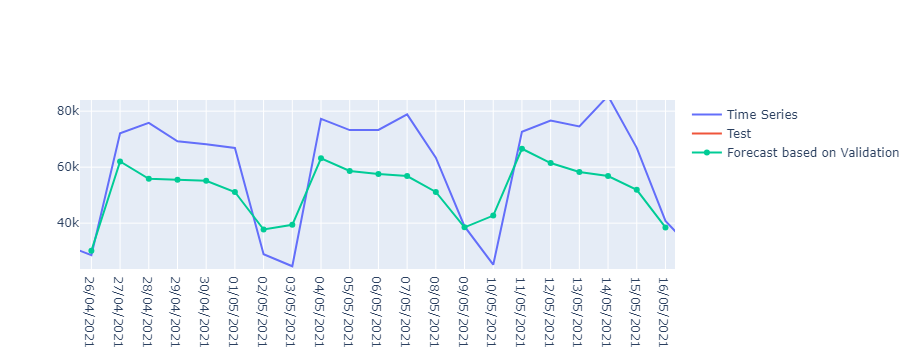

In [16]:
### SMA3 FINAL

df_Total_Val    = Fcast_df['Fcast_sma3_Test_val']   -  Fcast_df['Fcast_RES3_Test_val']
#df_Total_Train  = Fcast_df['Fcast_sma3_Test_train'] -  Fcast_df['Fcast_RES3_Test_train']

TotalSuma_Val   = np.array(df_Total_Val)
#TotalSuma_Train = np.array(df_Total_Train)

#Fcast_df tiene el tamaño de validation, es necesario recortarlo para el cálculo de mda y rmse
TotalSuma_Val   = TotalSuma_Val[0:Steps_Fcast]
#TotalSuma_Train = TotalSuma_Train[0:Steps_Fcast]
#Reshaping
TotalSuma_Val   = np.reshape(TotalSuma_Val, (-1,1))
#TotalSuma_Train = np.reshape(TotalSuma_Train, (-1,1))

#Raw = np.array(Raw.values)
#Raw             = np.array(Raw)
#Raw             = np.reshape(Raw, (-1,1))
Test_df         = pd.DataFrame(Raw[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test            = np.array(Test_df)

print('Mape del Pronóstico Total')
#Mape_Train, Dif_Train  = MAPE(Test, TotalSuma_Train)
Mape_Val,   Dif_Val    = MAPE(Test, TotalSuma_Val)

#MDA_Train              = mda(Test, TotalSuma_Train)
MDA_Val                = mda(Test, TotalSuma_Val)

print('Promedio de la Presición de la Dirección')
#print(MDA_Train)
print(MDA_Val)

print('RMSE')
#rmse_Train = RMSE(Test, TotalSuma_Train)
rmse_Val   = RMSE(Test, TotalSuma_Val)
#print(rmse_Train[0])
print(rmse_Val[0])

#Fcast_df['Total_Train']          = pd.DataFrame(df_Total_Train)
Fcast_df['Total_Val']            = pd.DataFrame(df_Total_Val)
Fcast_df['Real']                 = pd.DataFrame(Test_df)

fig = go.Figure()
# Add traces

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['Raw'], mode='lines', name='Time Series'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Validation_RES3'],mode='lines', name='Validation RES3'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES3_Val_train'], mode='lines+markers', name='Fcast RES3 Validation según train'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES3_Val_val'], mode='lines+markers', name='Fcast RES3 Validation según validation'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Real'], mode='lines', name='Test'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Total_Train'], mode='lines+markers', name='Forecast based on training'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Total_Val'], mode='lines+markers', name='Forecast based on Validation'))

fig.show()

In [17]:
### SMA7

### Getting the Training set
#Scaling

SMA7 = np.reshape(SMA7, (-1,1))

training_set_scaled_sma7 = sc.fit_transform(SMA7)

lim_train    = 350  # Límite superior del entrenamiento
L_train      = 21   #Ancho de ventana de entrenamiento

X_train_sma7 = []
y_train_sma7 = []

for i in range(L_train, lim_train):
    X_train_sma7.append(training_set_scaled_sma7[i-L_train:i, 0])
    y_train_sma7.append(training_set_scaled_sma7[i, 0])
    
X_train_sma7, y_train_sma7 = np.array(X_train_sma7), np.array(y_train_sma7)

print(X_train.shape)
print(y_train.shape)
#print(X_train)
#print(y_train)

# Getting the Validation set
Size_Val        = 42

Validation_sma7 = training_set_scaled_sma7[lim_train:lim_train + Size_Val]

X_val_sma7 = []
y_val_sma7 = []
    
### Validación del tamaño de validación.     
for i in range(lim_train, lim_train + Size_Val):
    X_val_sma7.append(training_set_scaled_sma7[i - L_train:i, 0])
    y_val_sma7.append(training_set_scaled_sma7[i, 0])
    
X_val_sma7, y_val_sma7 = np.array(X_val_sma7), np.array(y_val_sma7)

print('X_val')
print(X_val.shape)
#print(X_val)
print('y_val')
print(y_val.shape)
#print(y_val)
print('Validación Real')
#print(training_set_scaled[lim_train:lim_train + Size_Val])

# Reshaping

X_train_sma7 = np.reshape(X_train_sma7, (X_train.shape[0], X_train.shape[1], 1))
X_val_sma7   = np.reshape(X_val_sma7,   (X_val.shape[0],X_val.shape[1], 1))
#print(X_train.shape)

#print('Validación')
#print(Validation)

(329, 21, 1)
(329,)
X_val
(42, 21, 1)
y_val
(42,)
Validación Real


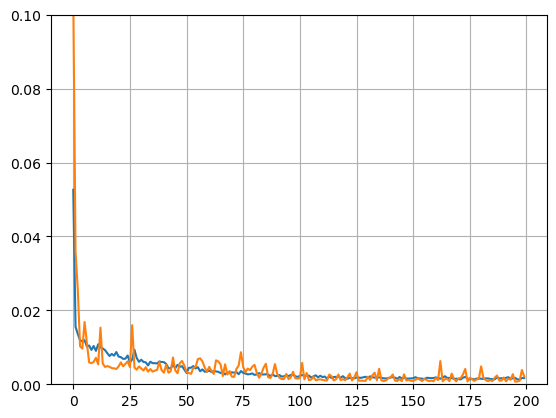

Bestof
1


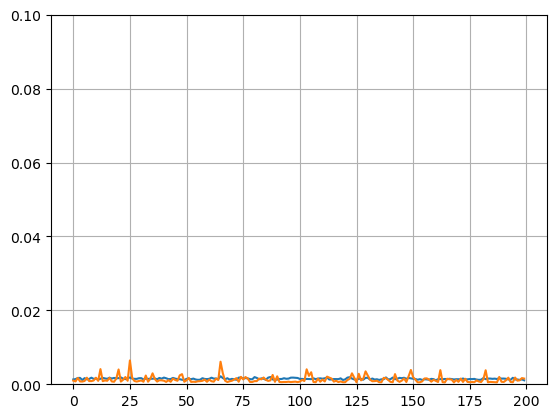

Bestof
2


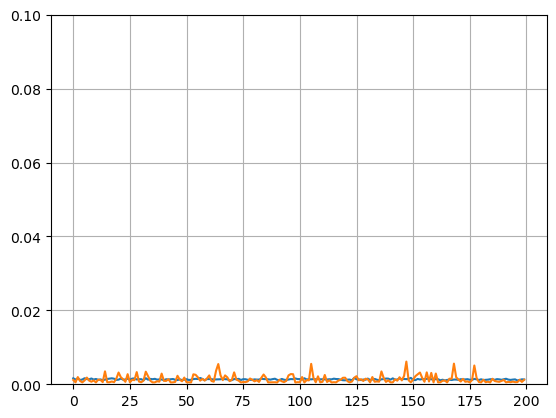

Bestof
3


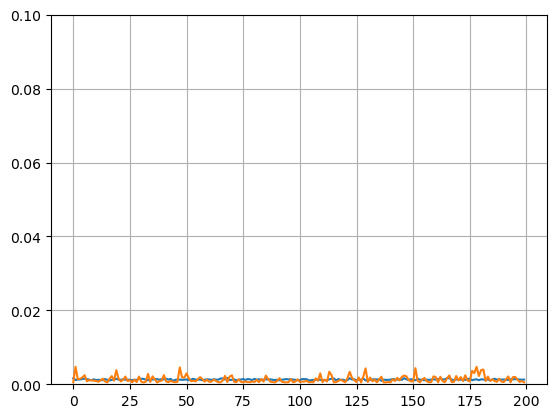

Bestof
4


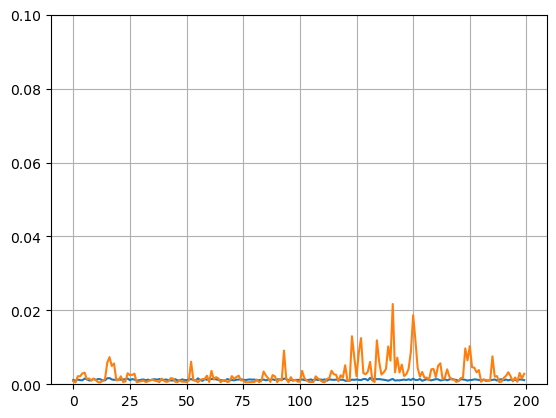

Bestof
5


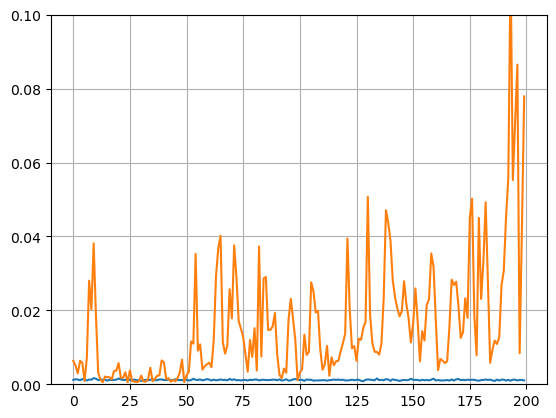

Bestof
6


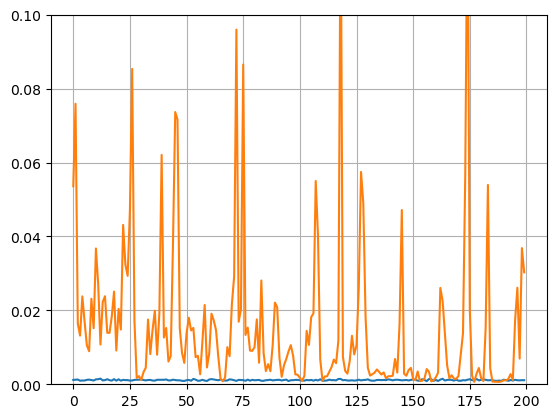

Bestof
7


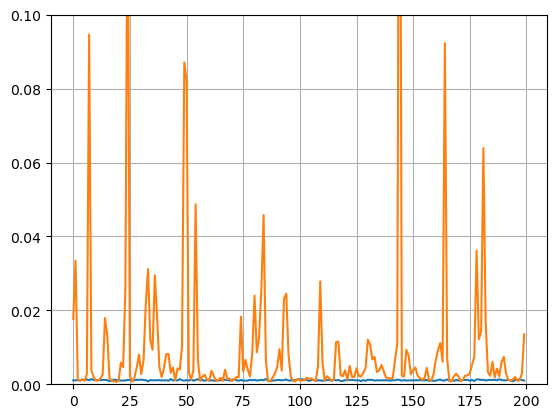

Bestof
8


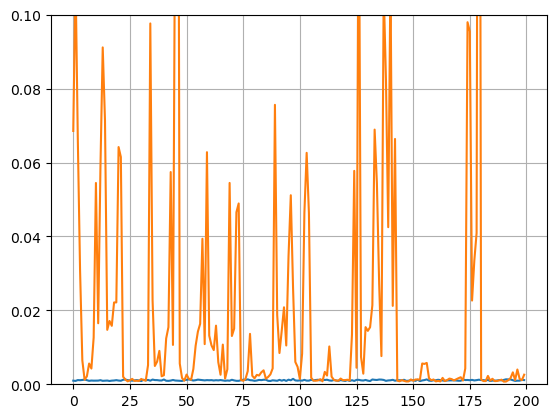

Bestof
9


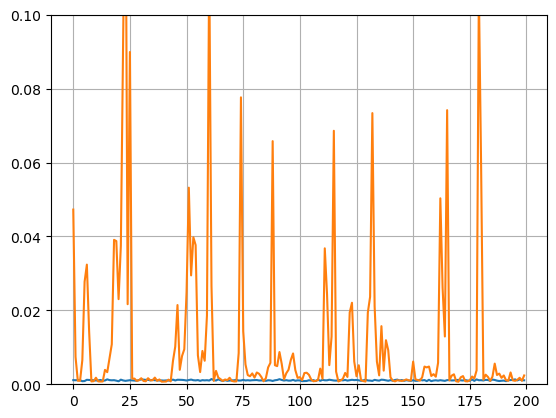

Bestof
10


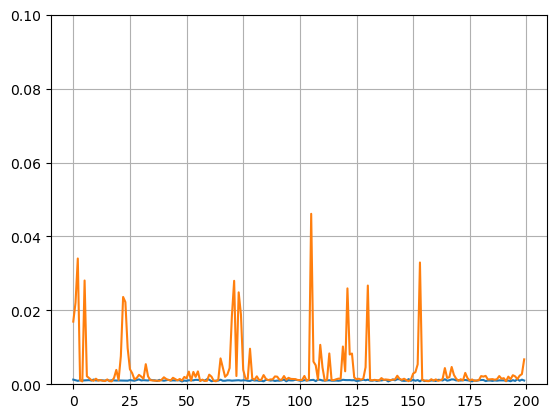

Bestof
11


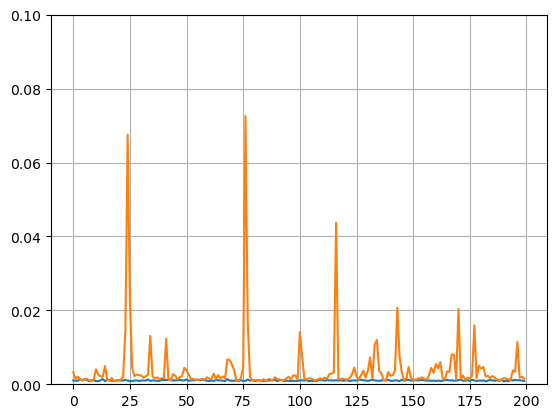

Bestof
12


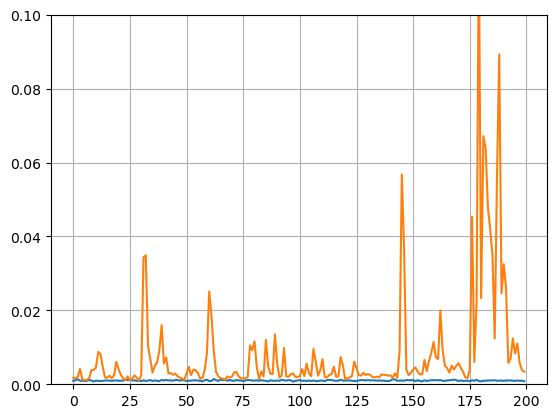

Bestof
13


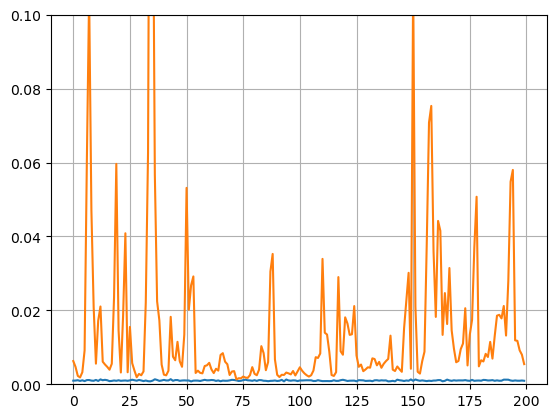

Bestof
14


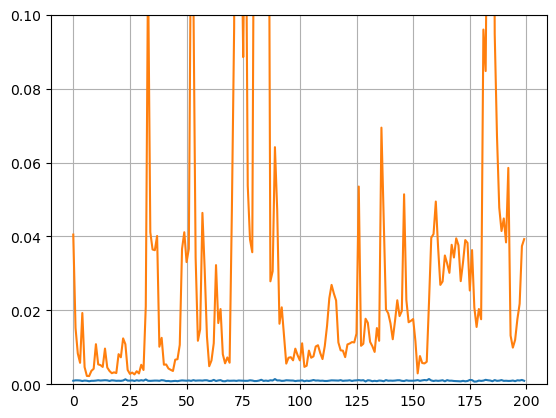

Bestof
15


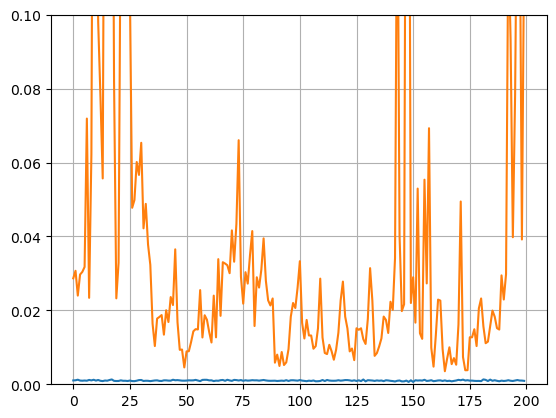

Bestof
16


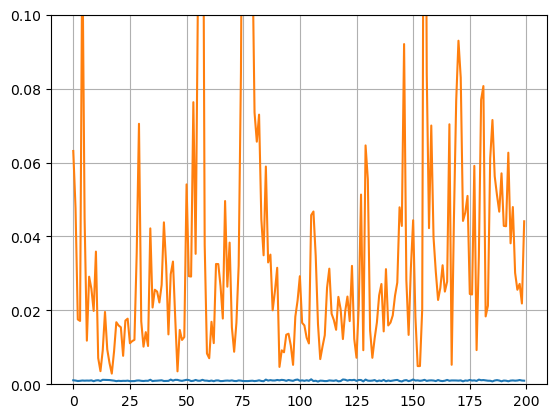

Bestof
17


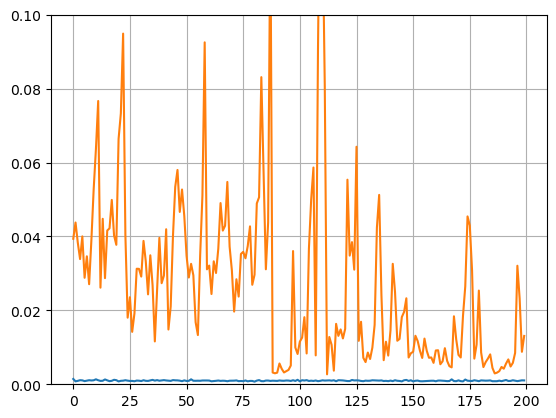

Bestof
18


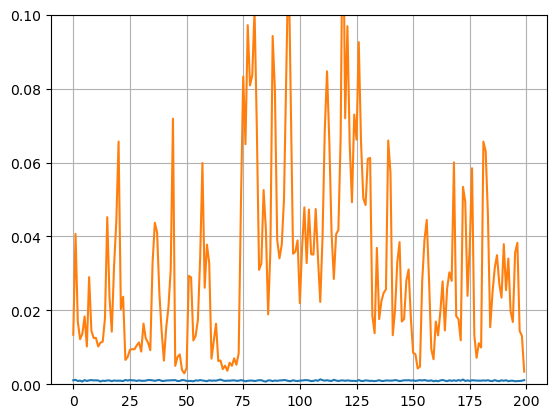

Bestof
19


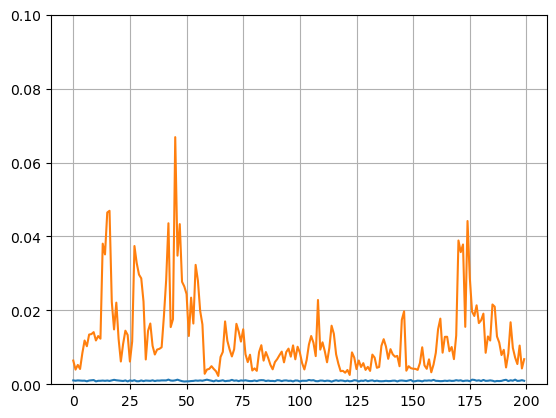

Bestof
20
Repetición
1


In [18]:
### SMA7
Bestof      = 20
Repes       = 1
batch_size  = 14
epochs      = 200
A_mse = []
Aval_mse = [] #val_mse

all_FcastVal_train  = []
all_FcastVal_val    = []
all_FcastTest_train = []
all_FcastTest_val   = []

#Modos, para pronóstico de filtro sma3 usar:
mode = model_lstm33(opt='adam')
#Modos, para pronóstico de residuos usar:
#mode = model_lstm2(opt='adam')

Rep = 0

for run in range(0,Repes):
    FcastVal_train, FcastTest_train, FcastVal_val, FcastTest_val, all_mse, all_val_mse = Better_LSTM(X_train_sma7, y_train_sma7, X_val_sma7, y_val_sma7, Bestof, mode)
    
    all_FcastVal_train.append(FcastVal_train[:])
    all_FcastTest_train.append(FcastTest_train[:])
    all_FcastVal_val.append(FcastVal_val[:])
    all_FcastTest_val.append(FcastTest_val[:])
    Rep = Rep + 1
    print('Repetición')
    print(Rep)

In [19]:
### SMA7

### Promediando todos los repes pronósticos.
avg_FcastVal_train  = np.mean(all_FcastVal_train, axis=0)
avg_FcastTest_train = np.mean(all_FcastTest_train, axis=0)
avg_FcastVal_val    = np.mean(all_FcastVal_val, axis=0)
avg_FcastTest_val   = np.mean(all_FcastTest_val, axis=0)

### Poniendolos en un vector de uno porque el inverse no puede
avg_FcastVal_train    = np.array(avg_FcastVal_train).reshape(-1,1)
avg_FcastTest_train   = np.array(avg_FcastTest_train).reshape(-1,1)
avg_FcastVal_val      = np.array(avg_FcastVal_val).reshape(-1,1)
avg_FcastTest_val     = np.array(avg_FcastTest_val).reshape(-1,1)


### Desescalando los pronósticos.
fc_val_train  = sc.inverse_transform(avg_FcastVal_train)
fc_test_train = sc.inverse_transform(avg_FcastTest_train)
fc_val_val    = sc.inverse_transform(avg_FcastVal_val)
fc_test_val   = sc.inverse_transform(avg_FcastTest_val)

Val_df        = pd.DataFrame(SMA7[lim_train:lim_train + Size_Val])
Val           = np.array(Val_df)
Test_df       = pd.DataFrame(SMA7[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test          = np.array(Test_df)

### Métricas de Desempeño
print('Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Val, fc_val_train)
print('MDA')
MDA = mda(Val, fc_val_train)
print(MDA)
print('RMSE')
rmse = RMSE(Val, fc_val_train)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Test, fc_test_train)
print('MDA')
MDA = mda(Test, fc_test_train)
print(MDA)
print('RMSE')
rmse = RMSE(Test, fc_test_train)
print(rmse[0])

print('Medidas de error del pronóstico de Validación según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Val, fc_val_val)
print('MDA')
MDA = mda(Val, fc_val_val)
print(MDA)
print('RMSE')
rmse = RMSE(Val, fc_val_val)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Test, fc_test_val)
print('MDA')
MDA = mda(Test, fc_test_val)
print(MDA)
print('RMSE')
rmse = RMSE(Test, fc_test_val)
print(rmse[0])

Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento
MAPE
5.415669580183357
MDA
53.65853658536586
53.65853658536586
RMSE
4484.6800316596355
Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento
MAPE
4.909976800608204
MDA
70.0
70.0
RMSE
4185.083514365231
Medidas de error del pronóstico de Validación según el mejor mse de validación
MAPE
1.9327784752864094
MDA
56.09756097560976
56.09756097560976
RMSE
1761.1989874405692
Medidas de error del pronóstico de Prueba según el mejor mse de validación
MAPE
11.772822222654845
MDA
55.00000000000001
55.00000000000001
RMSE
8023.959880982577


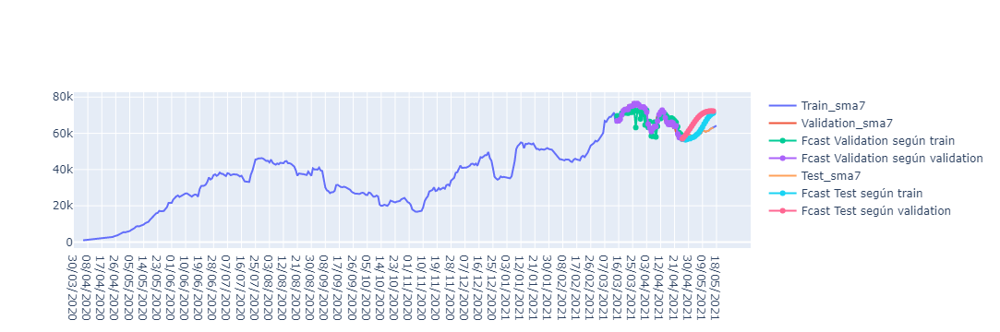

In [20]:
### SMA7
# Part 5 - Visualising the Forecast 

Fcast_df['Validation_SMA7']        = pd.DataFrame(Val_df.values)
Fcast_df['Fcast_SMA7_Val_train']   = pd.DataFrame(fc_val_train)
Fcast_df['Fcast_SMA7_Val_val']     = pd.DataFrame(fc_val_val)

Fcast_df['Test_SMA7']              = pd.DataFrame(Test_df.values)
Fcast_df['Fcast_SMA7_Test_train']  = pd.DataFrame(fc_test_train)
Fcast_df['Fcast_SMA7_Test_val']    = pd.DataFrame(fc_test_val)

fig = go.Figure()

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['SMA_7'] ,
                        mode='lines', name='Train_sma7'))

fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Validation_SMA7'],
                        mode='lines', name='Validation_sma7'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_SMA7_Val_train'],
                        mode='lines+markers', name='Fcast Validation según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_SMA7_Val_val'],
                        mode='lines+markers', name='Fcast Validation según validation'))

fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Test_SMA7'],
                        mode='lines', name='Test_sma7'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_SMA7_Test_train'],
                        mode='lines+markers', name='Fcast Test según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_SMA7_Test_val'],
                        mode='lines+markers', name='Fcast Test según validation'))

fig.show()


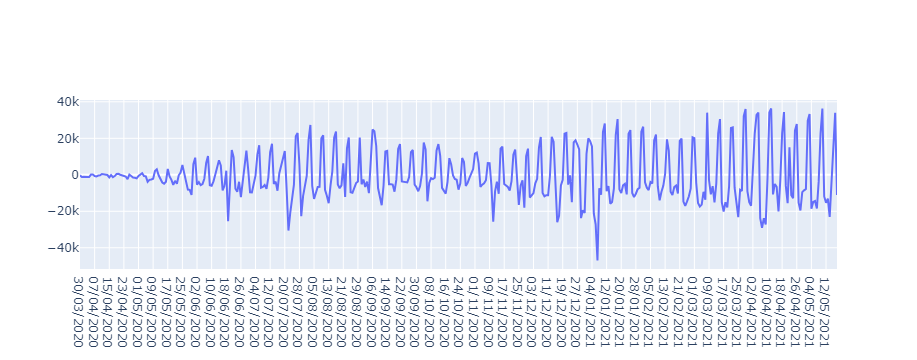

In [21]:
###SMA7 RESIDUES

ResSMA7_df = pd.DataFrame(SMA7 - time_series)
ResSMA7 = ResSMA7_df.to_numpy()

### Visualización
COVID_Time_Series_df['RSMA7'] = pd.DataFrame(ResSMA7_df.values)

# Add traces
fig = go.Figure()

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'], y=COVID_Time_Series_df['RSMA7'], mode='lines',name='All the Residuals from SMA7'))

fig.show()

In [22]:
###SMA7 RESIDUES

residual_set_scaled_sma7 = sc.fit_transform(ResSMA7)

X_train_sma7 = []
y_train_sma7 = []

for i in range(L_train, lim_train):
    X_train_sma7.append(residual_set_scaled_sma7[i - L_train : i, 0])
   
    y_train_sma7.append(residual_set_scaled_sma7[i, 0])
    
X_train_sma7, y_train_sma7 = np.array(X_train_sma7), np.array(y_train_sma7)

# Getting the Validation set
Validation_sma7 = residual_set_scaled_sma7[lim_train:lim_train + Size_Val]

X_val_sma7 = []
y_val_sma7 = []
    
### Validación del tamaño de validación.     
for i in range(lim_train, lim_train + Size_Val):
    X_val_sma7.append(residual_set_scaled_sma7[i - L_train:i, 0])
    y_val_sma7.append(residual_set_scaled_sma7[i, 0])

X_val_sma7, y_val_sma7 = np.array(X_val_sma7), np.array(y_val_sma7)

# Reshaping
X_train_sma7 = np.reshape(X_train_sma7, (X_train.shape[0], X_train.shape[1], 1))
X_val_sma7   = np.reshape(X_val_sma7,   (X_val.shape[0],X_val.shape[1], 1))

print(X_train_sma7.shape)
print(y_train_sma7.shape)
print(X_val_sma7.shape)
print(y_val_sma7.shape)
#print(X_val_sma3)
print(y_val_sma7)

(329, 21, 1)
(329,)
(42, 21, 1)
(42,)
[0.93021116 0.38308972 0.32209603 0.38344104 0.34925099 0.48972156
 0.87184128 0.8756356  0.47872762 0.3905207  0.28501653 0.46557944
 0.45751264 0.94963522 0.99664098 0.45693167 0.38412656 0.36043174
 0.58750683 0.83488003 0.95793338 0.97337632 0.27844073 0.21536993
 0.27869265 0.23763203 0.54428855 0.97315695 1.         0.43513744
 0.50386887 0.48489725 0.32264101 0.53137345 0.83734788 0.9767302
 0.49094863 0.37755419 0.74452574 0.43016403 0.4090793  0.85381223]


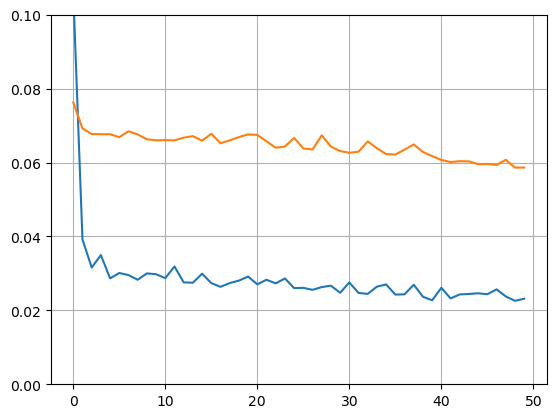

Bestof
1


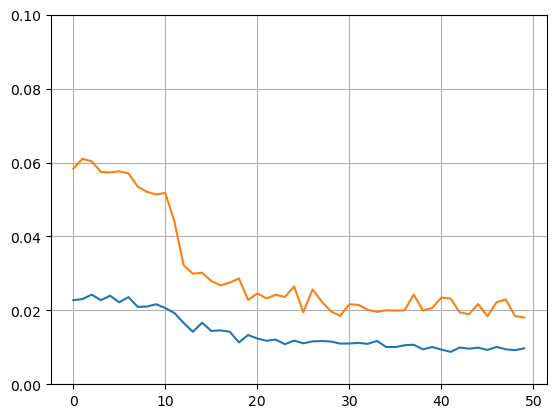

Bestof
2


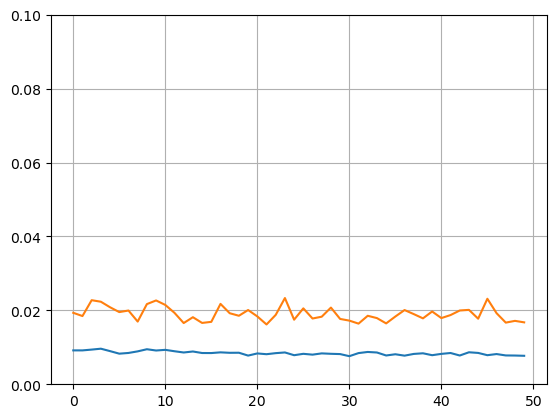

Bestof
3


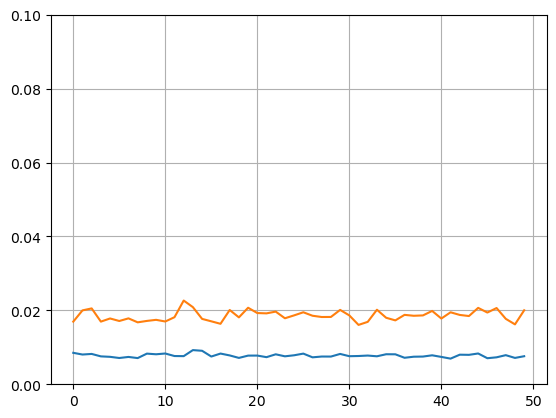

Bestof
4


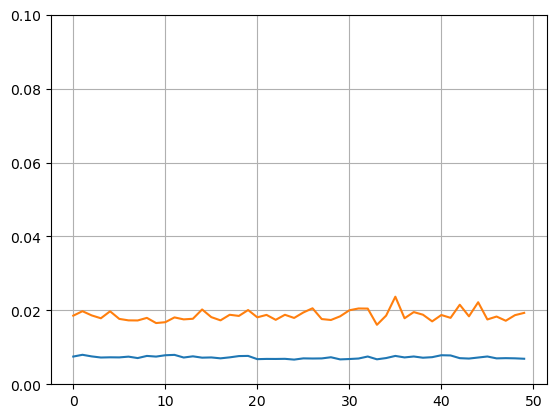

Bestof
5


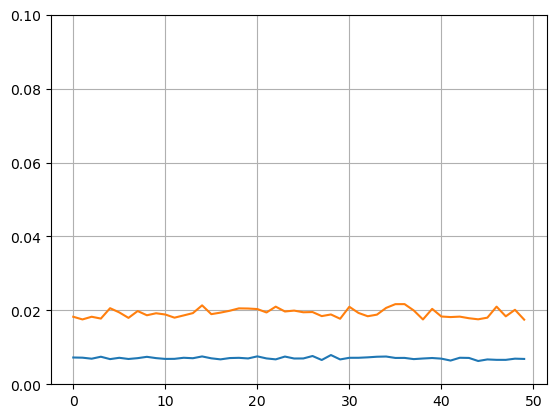

Bestof
6


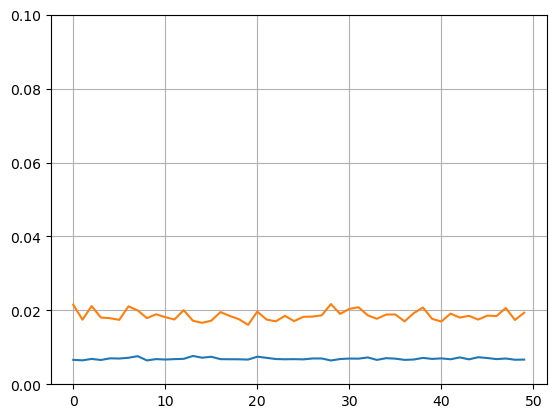

Bestof
7


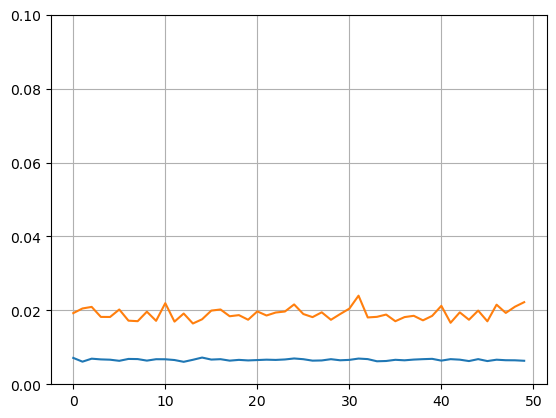

Bestof
8


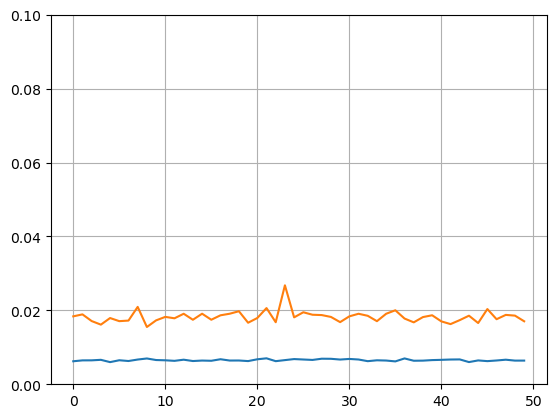

Bestof
9


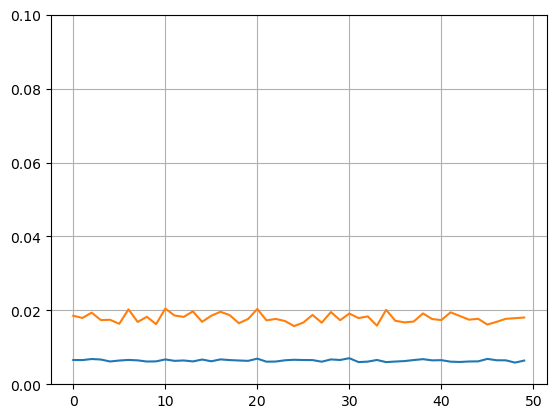

Bestof
10


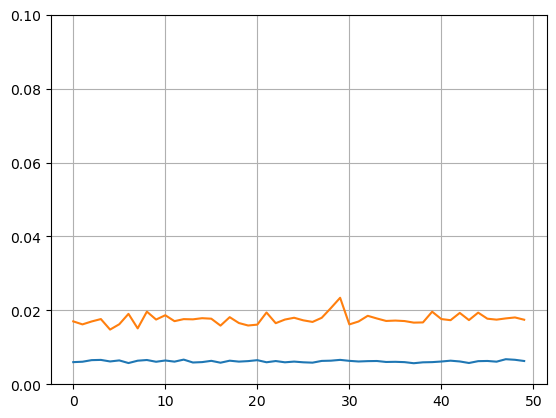

Bestof
11


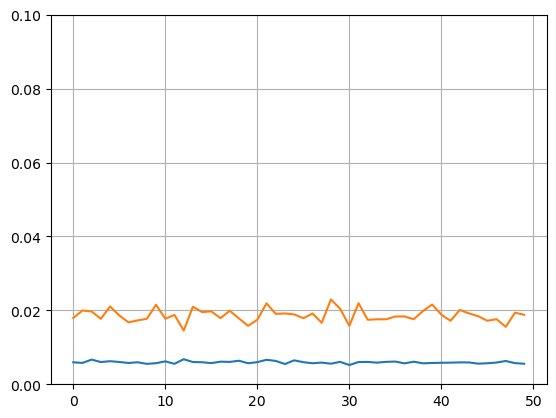

Bestof
12


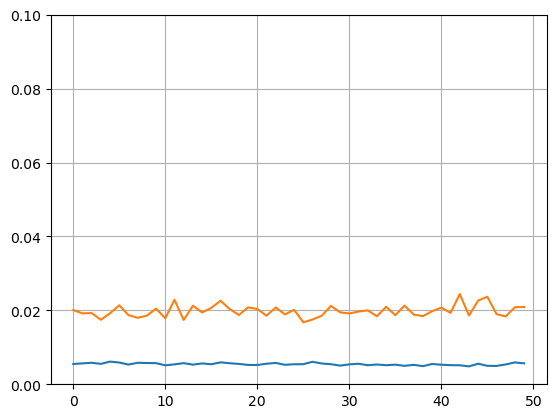

Bestof
13


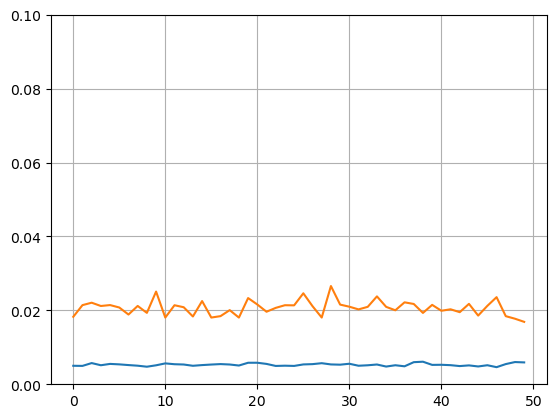

Bestof
14


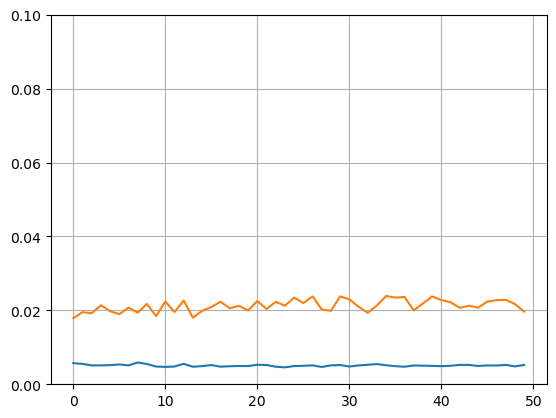

Bestof
15


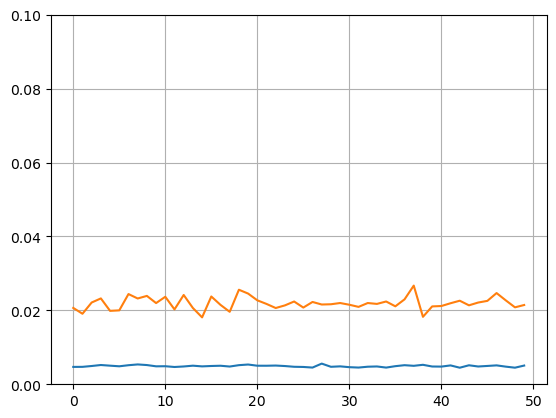

Bestof
16


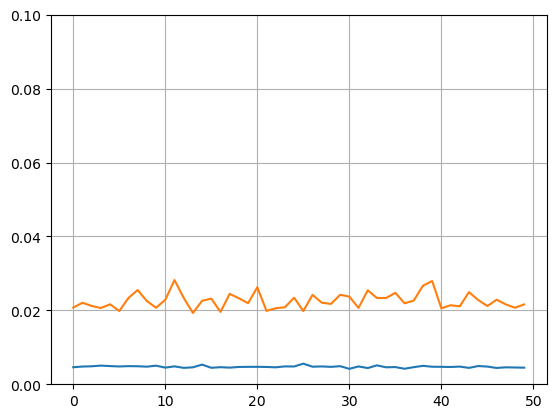

Bestof
17


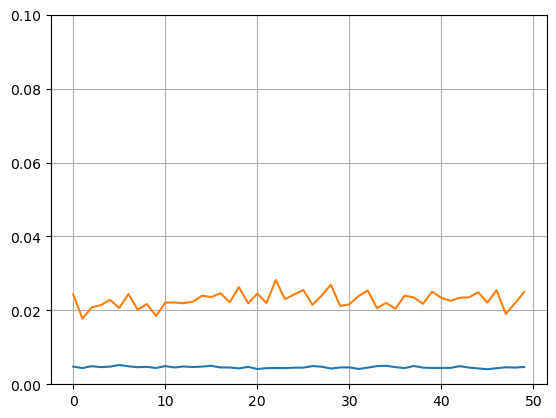

Bestof
18


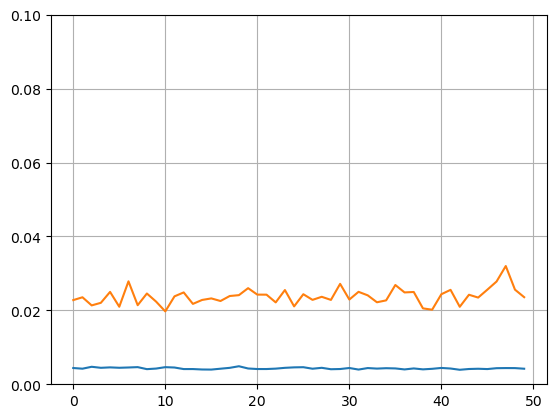

Bestof
19


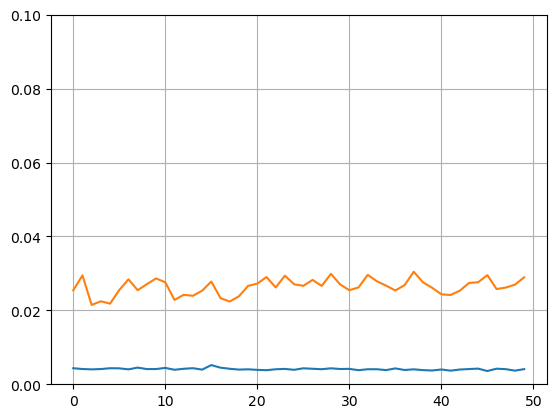

Bestof
20
Repetición
1


In [23]:
###SMA7 RESIDUES

Bestof      = 20
Repes       = 1
batch_size  = 14
epochs      = 50

A_mse = []
Aval_mse = [] #val_mse

all_FcastVal_train  = []
all_FcastVal_val    = []
all_FcastTest_train = []
all_FcastTest_val   = []

#Modos, para pronóstico de filtro sma3 usar:
#mode = model_lstm(opt='adam')
#Modos, para pronóstico de residuos usar:
mode = model_lstm2(opt='adam')

Rep = 0

for run in range(0,Repes):
    FcastVal_train, FcastTest_train, FcastVal_val, FcastTest_val, all_mse, all_val_mse = Better_LSTM(X_train_sma7, y_train_sma7, X_val_sma7, y_val_sma7, Bestof, mode)
    
    all_FcastVal_train.append(FcastVal_train[:])
    all_FcastTest_train.append(FcastTest_train[:])
    all_FcastVal_val.append(FcastVal_val[:])
    all_FcastTest_val.append(FcastTest_val[:])
    Rep = Rep + 1
    print('Repetición')
    print(Rep)

In [24]:
###SMA7 RESIDUES

### Promediando todos los repes pronósticos.
avg_FcastVal_train  = np.mean(all_FcastVal_train, axis=0)
avg_FcastTest_train = np.mean(all_FcastTest_train, axis=0)
avg_FcastVal_val    = np.mean(all_FcastVal_val, axis=0)
avg_FcastTest_val   = np.mean(all_FcastTest_val, axis=0)

### Poniendolos en un vector de uno porque el inverse no puede
avg_FcastVal_train    = np.array(avg_FcastVal_train).reshape(-1,1)
avg_FcastTest_train   = np.array(avg_FcastTest_train).reshape(-1,1)
avg_FcastVal_val      = np.array(avg_FcastVal_val).reshape(-1,1)
avg_FcastTest_val     = np.array(avg_FcastTest_val).reshape(-1,1)


### Desescalando los pronósticos.
fc_val_train  = sc.inverse_transform(avg_FcastVal_train)
fc_test_train = sc.inverse_transform(avg_FcastTest_train)
fc_val_val    = sc.inverse_transform(avg_FcastVal_val)
fc_test_val   = sc.inverse_transform(avg_FcastTest_val)

Val_df        = pd.DataFrame(ResSMA7[lim_train:lim_train + Size_Val])
Val           = np.array(Val_df)
Test_df       = pd.DataFrame(ResSMA7[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test          = np.array(Test_df)

### Métricas de Desempeño
print('Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Val, fc_val_train)
print('MDA')
MDA = mda(Val, fc_val_train)
print(MDA)
print('RMSE')
rmse = RMSE(Val, fc_val_train)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Test, fc_test_train)
print('MDA')
MDA = mda(Test, fc_test_train)
print(MDA)
print('RMSE')
rmse = RMSE(Test, fc_test_train)
print(rmse[0])

print('Medidas de error del pronóstico de Validación según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Val, fc_val_val)
print('MDA')
MDA = mda(Val, fc_val_val)
print(MDA)
print('RMSE')
rmse = RMSE(Val, fc_val_val)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Test, fc_test_val)
print('MDA')
MDA = mda(Test, fc_test_val)
print(MDA)
print('RMSE')
rmse = RMSE(Test, fc_test_val)
print(rmse[0])

Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento
MAPE
105.3326218476261
MDA
78.04878048780488
78.04878048780488
RMSE
14180.381046795512
Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento
MAPE
44.54093462342677
MDA
65.0
65.0
RMSE
9809.487873244772
Medidas de error del pronóstico de Validación según el mejor mse de validación
MAPE
64.18925192390489
MDA
75.60975609756098
75.60975609756098
RMSE
10789.424557284763
Medidas de error del pronóstico de Prueba según el mejor mse de validación
MAPE
43.64435299645235
MDA
85.0
85.0
RMSE
8169.128265397451


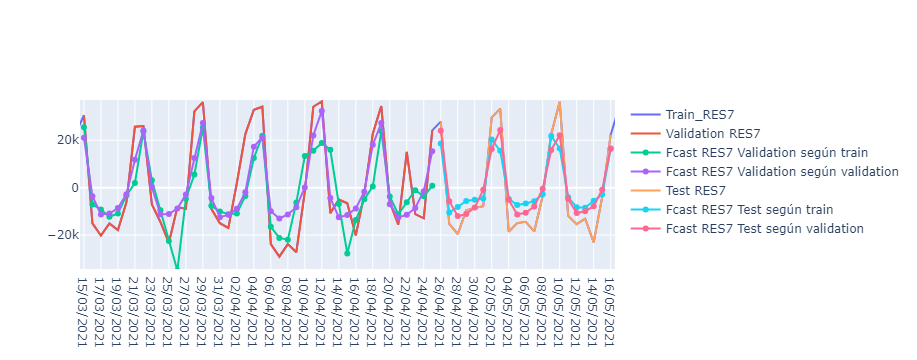

In [25]:
###SMA7 RESIDUES
# Part 5 - Visualising the Forecast 

Fcast_df['Validation_RES7']        = pd.DataFrame(Val_df.values)

Fcast_df['Fcast_RES7_Val_train']   = pd.DataFrame(fc_val_train)
Fcast_df['Fcast_RES7_Val_val']     = pd.DataFrame(fc_val_val)

Fcast_df['Test_RES7']              = pd.DataFrame(Test_df.values)
Fcast_df['Fcast_RES7_Test_train']  = pd.DataFrame(fc_test_train)
Fcast_df['Fcast_RES7_Test_val']    = pd.DataFrame(fc_test_val)

fig = go.Figure()
# Add traces

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['RSMA7'], mode='lines', name='Train_RES7'))
                        

fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Validation_RES7'],mode='lines', name='Validation RES7'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES7_Val_train'], mode='lines+markers', name='Fcast RES7 Validation según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES7_Val_val'], mode='lines+markers', name='Fcast RES7 Validation según validation'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Test_RES7'], mode='lines', name='Test RES7'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_RES7_Test_train'], mode='lines+markers', name='Fcast RES7 Test según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_RES7_Test_val'], mode='lines+markers', name='Fcast RES7 Test según validation'))

fig.show()

Mape del Pronóstico Total
20.175298151138737
80.0
Promedio de la Presición de la Dirección
80.0
RMSE
10100.697874942685


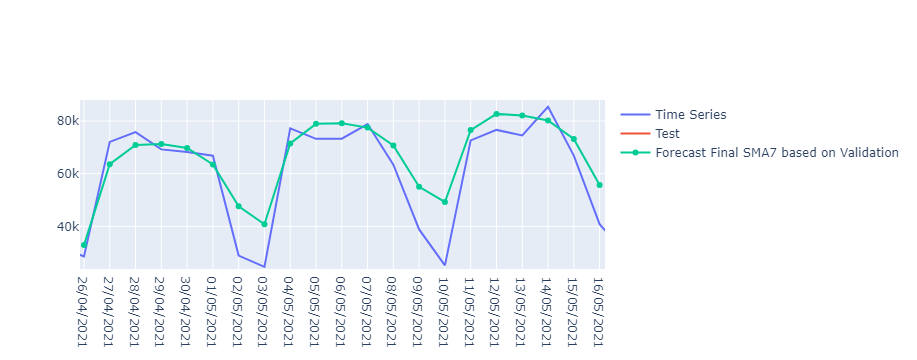

In [26]:
### SMA7 FINAL

df_Total_Val    = Fcast_df['Fcast_SMA7_Test_val']   -  Fcast_df['Fcast_RES7_Test_val']

TotalSuma_Val   = np.array(df_Total_Val)

#Fcast_df tiene el tamaño de validation, es necesario recortarlo para el cálculo de mda y rmse
TotalSuma_Val   = TotalSuma_Val[0:Steps_Fcast]
#Reshaping
TotalSuma_Val   = np.reshape(TotalSuma_Val, (-1,1))

Test_df         = pd.DataFrame(Raw[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test            = np.array(Test_df)

print('Mape del Pronóstico Total')
#Mape_Train, Dif_Train  = MAPE(Test, TotalSuma_Train)
Mape_Val,   Dif_Val    = MAPE(Test, TotalSuma_Val)

#MDA_Train              = mda(Test, TotalSuma_Train)
MDA_Val                = mda(Test, TotalSuma_Val)

print('Promedio de la Presición de la Dirección')
#print(MDA_Train)
print(MDA_Val)

print('RMSE')
#rmse_Train = RMSE(Test, TotalSuma_Train)
rmse_Val   = RMSE(Test, TotalSuma_Val)
#print(rmse_Train[0])
print(rmse_Val[0])

#Fcast_df['Total_Train']          = pd.DataFrame(df_Total_Train)
Fcast_df['Total_Val_SMA7']       = pd.DataFrame(df_Total_Val)
Fcast_df['Real']                 = pd.DataFrame(Test_df)

fig = go.Figure()
# Add traces

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['Raw'], mode='lines', name='Time Series'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Validation_RES3'],mode='lines', name='Validation RES3'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES3_Val_train'], mode='lines+markers', name='Fcast RES3 Validation según train'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES3_Val_val'], mode='lines+markers', name='Fcast RES3 Validation según validation'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Real'], mode='lines', name='Test'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Total_Train'], mode='lines+markers', name='Forecast based on training'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Total_Val_SMA7'], mode='lines+markers', name='Forecast Final SMA7 based on Validation'))

fig.show()

In [9]:
### FK1

def FK1(Train): # FILTRO DE KALMAN
    
    Y_raw = [i for i in range(len(Train))]
    Y = np.mat(Train)                    #Se carga la serie de tiempo.

    X = np.mat([[0,]])                   #Vector de estados inicializado en 0#Modificar aquí para cambiar base
    P = np.mat([[1]])                    #Matriz de covarianza P en estado inicial
    T = np.mat([[1]])                    #Matriz de transición de estados
    Q = np.mat([[10]])                   #MAtriz de covarianza Q, se define muy pequeña porque se cree que F es muy precisa
    Z = np.mat([1])                      #Matriz de Observación
    H = np.mat([300])                    #Matriz de covarianza R de ruido observada
    B = np. mat([[1]])                   #Matriz de entradas
    U = np.mat([[0]])                    #Vector de entradas

    X_FK = []
    XFK = []

    for i in range(len(Train)):
        x_predict = T * X + B * U                      
        p_predict = T * P * T.T + Q
        K = p_predict * Z.T / (Z * p_predict * Z.T + H)
        X = x_predict + K *(Y[i, 0] - Z * x_predict)
        P = (1 - K * Z) * p_predict
        
        x_parray = x_predict.reshape(-1)
        X_FK.append(x_parray[:])
        xarray = X.reshape(-1)
        XFK.append(xarray[:])
    
        plt.plot(Y_raw[i], X[0], 'ro', markersize = 2)         #Actualización del estado
        plt.plot(Y_raw[i], x_predict[0], 'go', markersize = 2) #Predicción del estado siguiente
        plt.plot(Y_raw[i], Y[i, 0], 'bo', markersize = 2)         #Serie Original
        
    plt.show()
    
    XFKF = np.array(XFK)
    X_FKF = np.array(X_FK)
    Filtered1 = XFKF.reshape(-1)          #Para univariable
        
    return Filtered1, XFKF

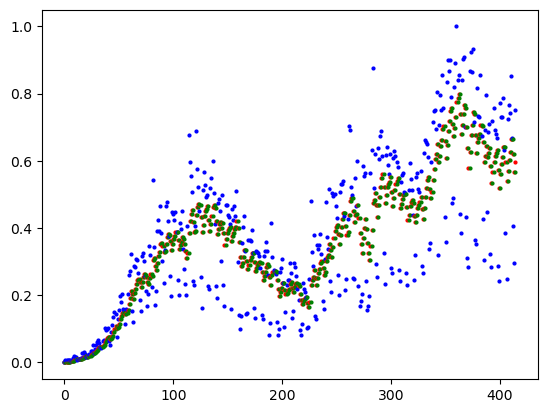

(415,)
(329, 21)
(329,)
X_val
(42, 21)
y_val
(42,)
(329, 21, 1)
(42, 21, 1)


In [10]:
### FK

#Filtering
FK, pred_FK = FK1(training_set_scaled)
print(FK.shape)

#lim_train    = 132  # Límite superior del entrenamiento
#L_train      = 21   #Ancho de ventana de entrenamiento

#Getting the training set
XFK_train      = []
yFK_train      = []

for i in range(L_train, lim_train):
    XFK_train.append(FK[i-L_train:i])
    yFK_train.append(FK[i])
    
XFK_train, yFK_train           = np.array(XFK_train), np.array(yFK_train)

print(XFK_train.shape)
print(yFK_train.shape)
#print(X_train)
#print(y_train)

# Getting the Validation set
#Size_Val        = 42
ValidationFK      = FK[lim_train:lim_train + Size_Val]

XFK_val      = []
yFK_val      = []

### Validación del tamaño de validación.     
for i in range(lim_train, lim_train + Size_Val):
    XFK_val.append(FK[i - L_train:i])
    yFK_val.append(FK[i])
      
XFK_val, yFK_val           = np.array(XFK_val), np.array(yFK_val)

print('X_val')
print(XFK_val.shape)
#print(X_val)
print('y_val')
print(yFK_val.shape)
#print(y_val)
#print('Validación Real')
#print(training_set_scaled[lim_train:lim_train + Size_Val])

# Reshaping
XFK_train      = np.reshape(XFK_train, (XFK_train.shape[0], XFK_train.shape[1], 1))
XFK_val        = np.reshape(XFK_val,   (XFK_val.shape[0],   XFK_val.shape[1], 1))
print(XFK_train.shape)
print(XFK_val.shape)

#print('Validación')
#print(Validation)


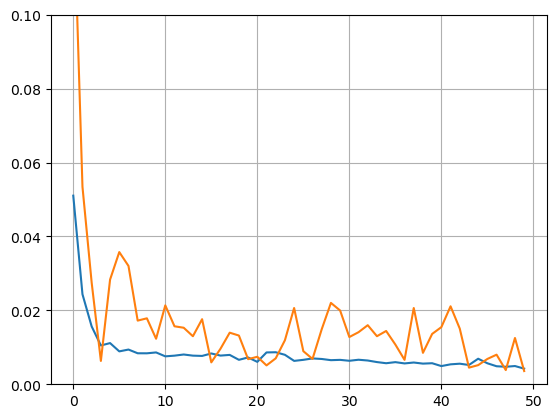

Bestof
1


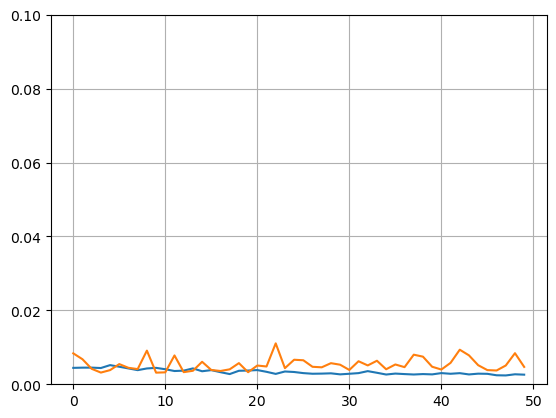

Bestof
2


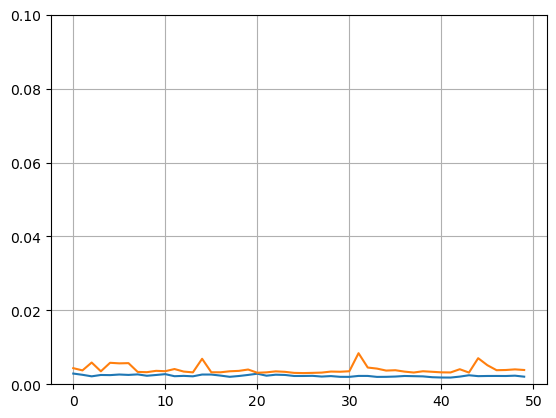

Bestof
3


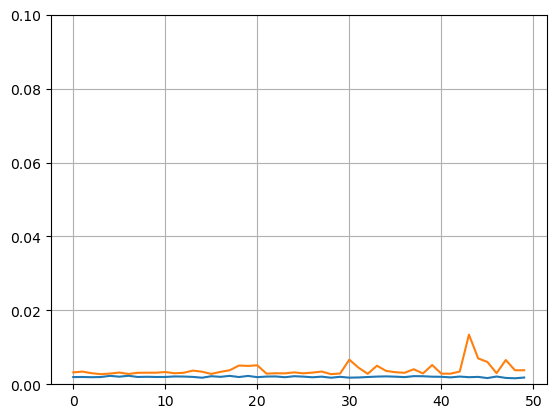

Bestof
4


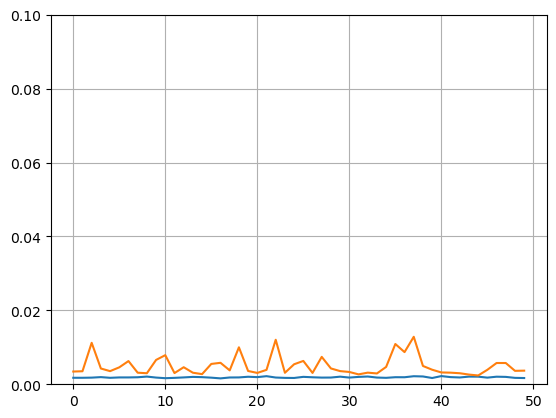

Bestof
5


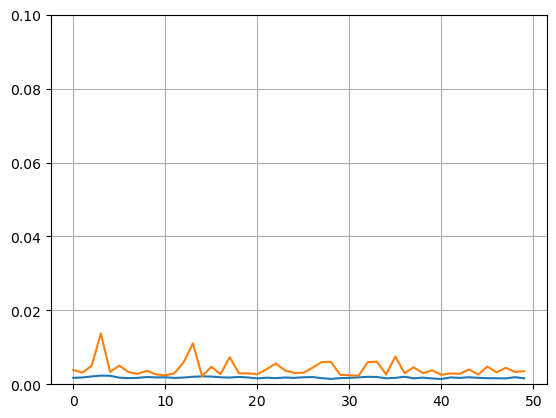

Bestof
6


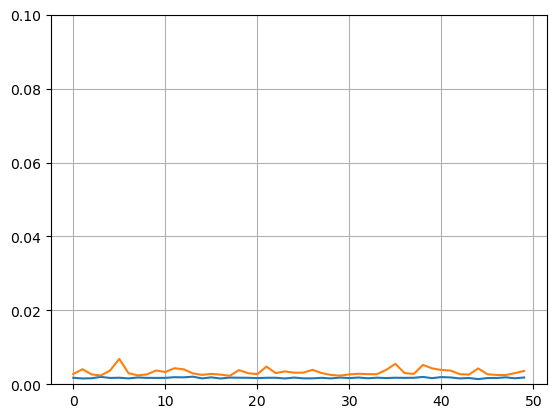

Bestof
7


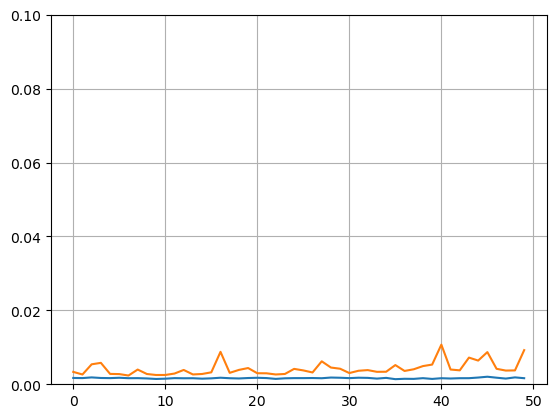

Bestof
8


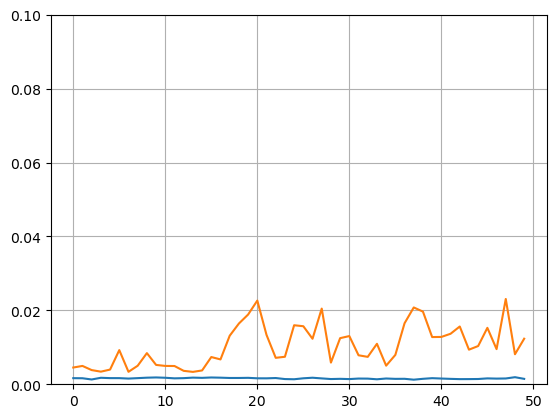

Bestof
9


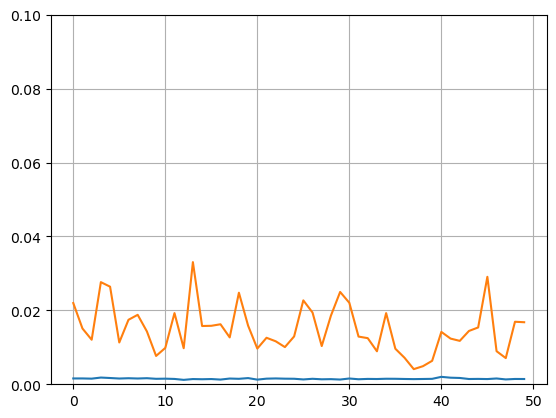

Bestof
10


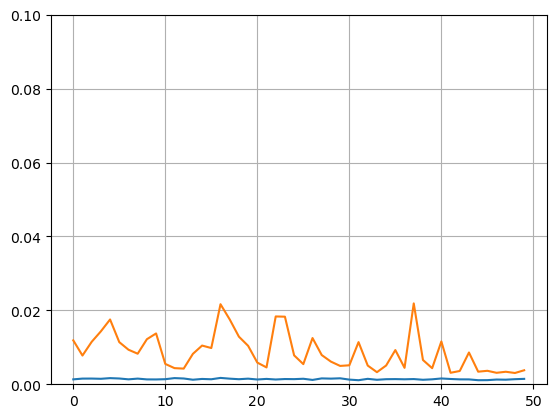

Bestof
11


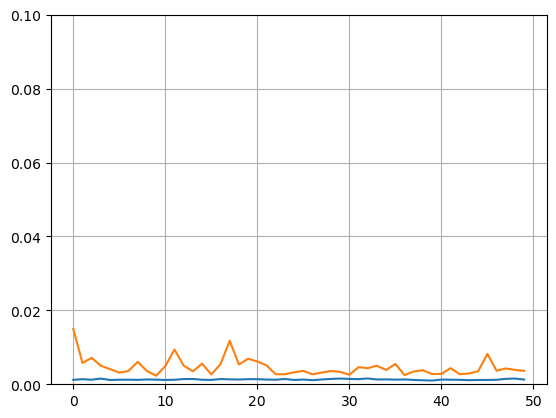

Bestof
12


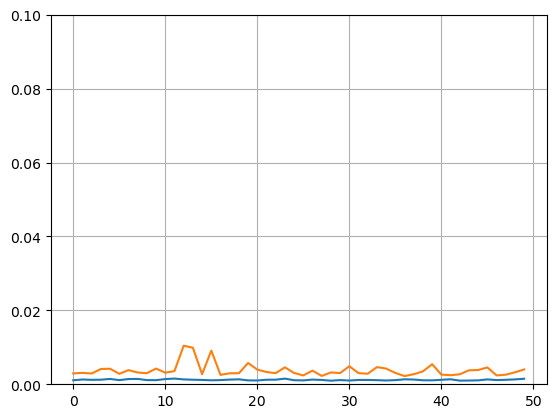

Bestof
13


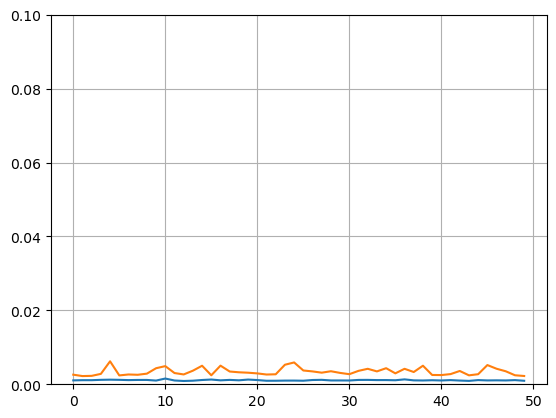

Bestof
14


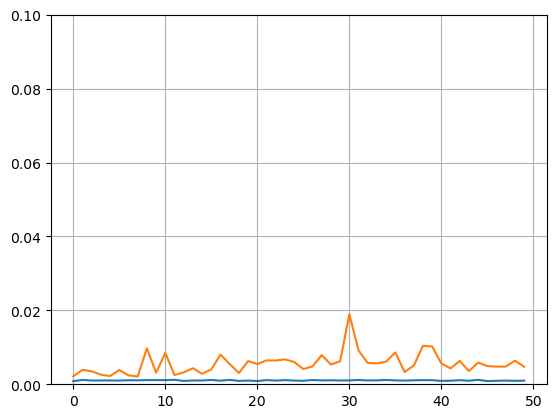

Bestof
15


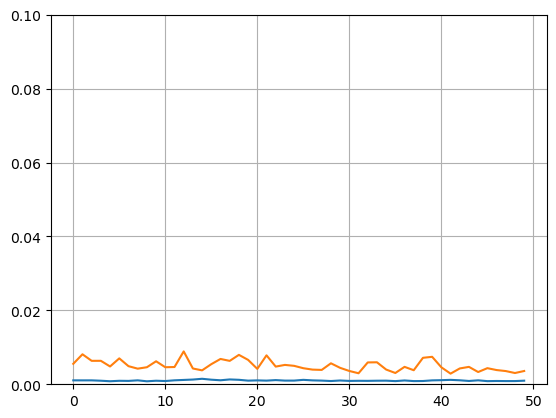

Bestof
16


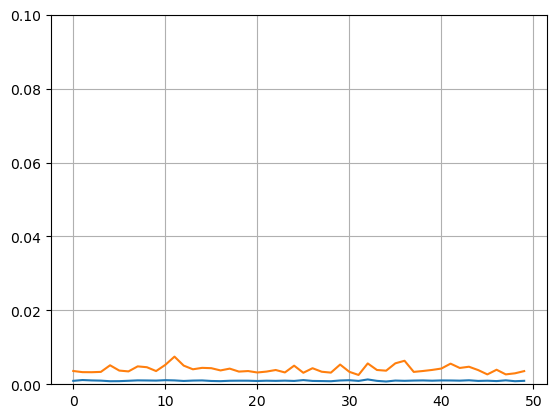

Bestof
17


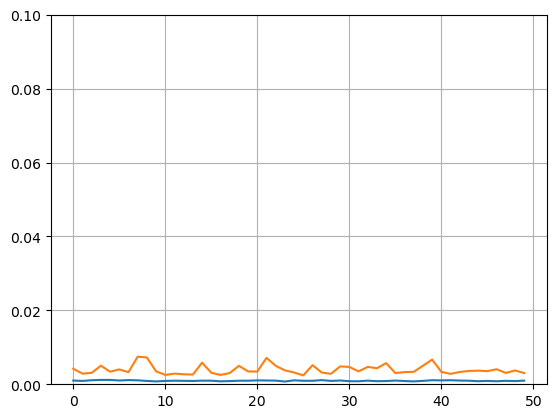

Bestof
18


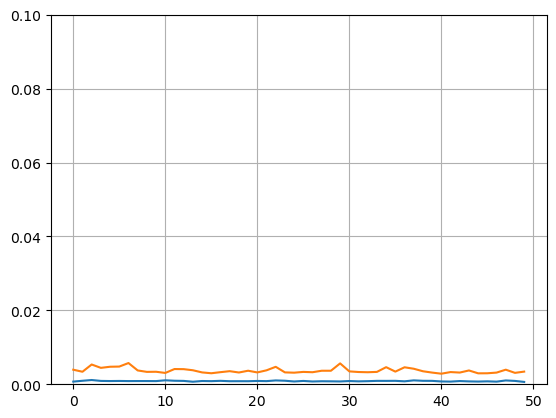

Bestof
19


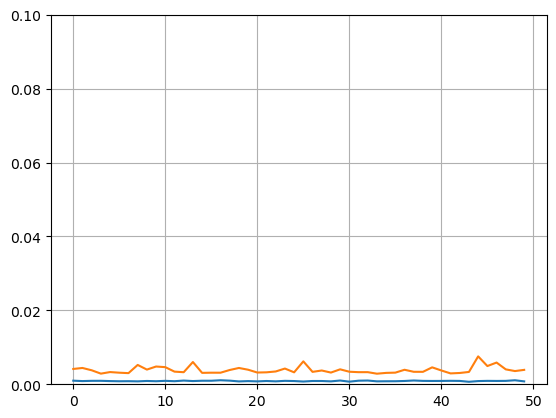

Bestof
20
Repetición
1


In [11]:
### FK
Steps_Fcast = 21
Bestof      = 20
Repes       = 1
batch_size  = 21
epochs      = 50

A_mse = []
Aval_mse = [] #val_mse

all_Fcast_FK_Val_train  = []
all_Fcast_FK_Val_val    = []
all_Fcast_FK_Test_train = []
all_Fcast_FK_Test_val   = []

#Modos, para pronóstico de filtro sma3 usar:
mode = model_lstm(opt='adam')
#Modos, para pronóstico de residuos usar:
#mode = model_lstm2(opt='adam')

Rep = 0

for run in range(0,Repes):
    FcastVal_train, FcastTest_train, FcastVal_val, FcastTest_val, all_mse, all_val_mse = Better_LSTM(XFK_train, yFK_train, XFK_val, yFK_val, Bestof, mode)
    
    all_Fcast_FK_Val_train.append(FcastVal_train[:])
    all_Fcast_FK_Test_train.append(FcastTest_train[:])
    all_Fcast_FK_Val_val.append(FcastVal_val[:])
    all_Fcast_FK_Test_val.append(FcastTest_val[:])
    Rep = Rep + 1
    print('Repetición')
    print(Rep)




In [12]:
### FK

### Average from the repetitions
avg_Fcast_FK_Val_train  = np.mean(all_Fcast_FK_Val_train, axis=0)
avg_Fcast_FK_Test_train = np.mean(all_Fcast_FK_Test_train, axis=0)
avg_Fcast_FK_Val_val    = np.mean(all_Fcast_FK_Val_val, axis=0)
avg_Fcast_FK_Test_val   = np.mean(all_Fcast_FK_Test_val, axis=0)
#print(avg_Fcast_FK_Val_train)

### Reshaping for desnormalizing
avg_Fcast_FK_Val_train    = np.array(avg_Fcast_FK_Val_train).reshape(-1,1)
avg_Fcast_FK_Test_train   = np.array(avg_Fcast_FK_Test_train).reshape(-1,1)
avg_Fcast_FK_Val_val      = np.array(avg_Fcast_FK_Val_val).reshape(-1,1)
avg_Fcast_FK_Test_val     = np.array(avg_Fcast_FK_Test_val).reshape(-1,1)
#print(avg_Fcast_FK_Val_train)

### Desnormalizing
fc_FK_val_train  = sc.inverse_transform(avg_Fcast_FK_Val_train)
fc_FK_test_train = sc.inverse_transform(avg_Fcast_FK_Test_train)
fc_FK_val_val    = sc.inverse_transform(avg_Fcast_FK_Val_val)
fc_FK_test_val   = sc.inverse_transform(avg_Fcast_FK_Test_val)
#print(fc_FK_val_train)

#Desescaling FK for performance indicators
FK_es = np.array(FK).reshape(-1,1)
FK_des = sc.inverse_transform(FK_es)

Val_FK_df        = pd.DataFrame(FK_des[lim_train:lim_train + Size_Val])
Val_FK           = np.array(Val_FK_df)
Test_FK_df       = pd.DataFrame(FK_des[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test_FK          = np.array(Test_FK_df)
#print(Val_FK)

### performance indicators
print('Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Val_FK, fc_FK_val_train)
print('MDA')
MDA = mda(Val_FK, fc_FK_val_train)
print(MDA)
print('RMSE')
rmse = RMSE(Val_FK, fc_FK_val_train)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Test_FK, fc_FK_test_train)
print('MDA')
MDA = mda(Test_FK, fc_FK_test_train)
print(MDA)
print('RMSE')
rmse = RMSE(Test_FK, fc_FK_test_train)
print(rmse[0])

print('Medidas de error del pronóstico de Validación según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Val_FK, fc_FK_val_val)
print('MDA')
MDA = mda(Val_FK, fc_FK_val_val)
print(MDA)
print('RMSE')
rmse = RMSE(Val_FK, fc_FK_val_val)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Test_FK, fc_FK_test_val)
print('MDA')
MDA = mda(Test_FK, fc_FK_test_val)
print(MDA)
print('RMSE')
rmse = RMSE(Test_FK, fc_FK_test_val)
print(rmse[0])

Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento
MAPE
7.384112009068045
MDA
87.8048780487805
87.8048780487805
RMSE
4505.748127900697
Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento
MAPE
24.07282115038065
MDA
35.0
35.0
RMSE
15703.771805147793
Medidas de error del pronóstico de Validación según el mejor mse de validación
MAPE
5.573757260264122
MDA
68.29268292682927
68.29268292682927
RMSE
3643.151928003645
Medidas de error del pronóstico de Prueba según el mejor mse de validación
MAPE
42.285929847859016
MDA
40.0
40.0
RMSE
24337.405811774785


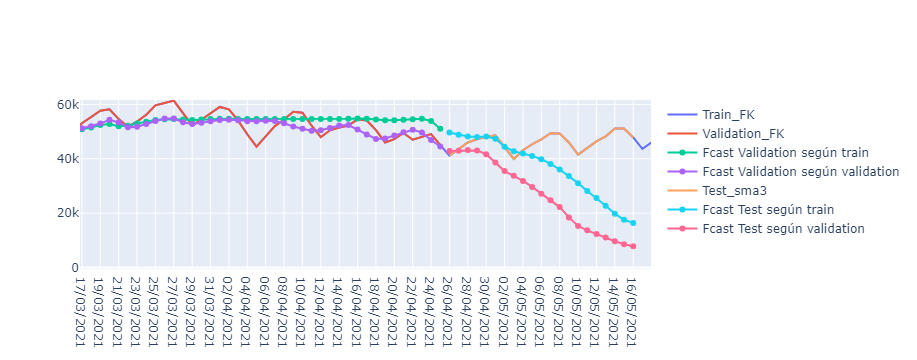

In [13]:
### FK
# Part 5 - Visualising the Forecast 
#run the line below if this is the first fcast.
Fcast_df                          = pd.DataFrame(Val_FK_df.values, columns=['FKValidation'])
#run the line below if this is not the first fcast.
#Fcast_df['FKValidation']          = pd.DataFrame(Val_FK_df.values)
Fechas_validation_df              = pd.DataFrame(Fechas[lim_train:lim_train + Size_Val])
Fcast_df['FechasValidation']      = pd.DataFrame(Fechas_validation_df.values)
Fcast_df['Fcast_FK_Val_train']    = pd.DataFrame(fc_FK_val_train)
Fcast_df['Fcast_FK_Val_val']      = pd.DataFrame(fc_FK_val_val)

Fcast_df['FKTest']                = pd.DataFrame(Test_FK_df.values)
Fcast_df['Fcast_FK_Test_train']   = pd.DataFrame(fc_FK_test_train)
Fcast_df['Fcast_FK_Test_val']     = pd.DataFrame(fc_FK_test_val)
Fechas_test_df                    = pd.DataFrame(Fechas[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Fcast_df['FechasTest']            = pd.DataFrame(Fechas_test_df.values)

#FK_des_df                         =
COVID_Time_Series_df['FK']        = pd.DataFrame(FK_des)

fig = go.Figure()
# Add traces
#fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['Raw'] ,
#                        mode='lines', name='Real'))
fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['FK'] ,
                        mode='lines', name='Train_FK'))

fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['FKValidation'],
                        mode='lines', name='Validation_FK'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_FK_Val_train'],
                        mode='lines+markers', name='Fcast Validation según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_FK_Val_val'],
                        mode='lines+markers', name='Fcast Validation según validation'))

fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['FKTest'],
                        mode='lines', name='Test_sma3'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_FK_Test_train'],
                        mode='lines+markers', name='Fcast Test según train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Fcast_FK_Test_val'],
                        mode='lines+markers', name='Fcast Test según validation'))

fig.show()



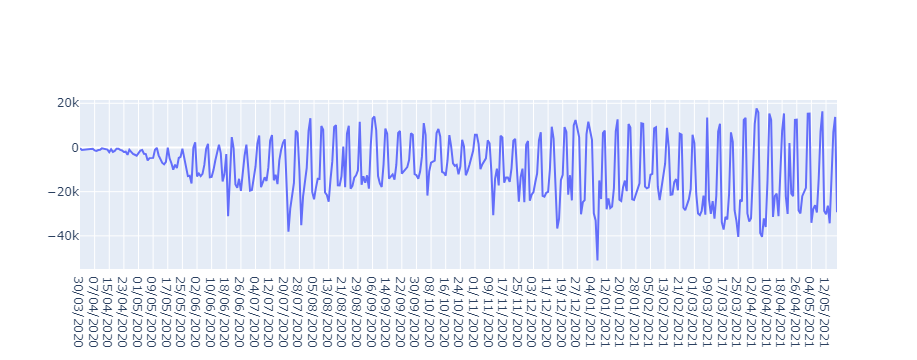

In [14]:
###FK1 RESIDUES

ResFK_df = pd.DataFrame(FK_des - time_series)
ResFK    = ResFK_df.to_numpy()

### Visualización
COVID_Time_Series_df['RFK'] = pd.DataFrame(ResFK_df.values)

# Add traces
fig = go.Figure()

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'], y=COVID_Time_Series_df['RFK'], mode='lines',name='All the Residuals'))

fig.show()

In [15]:
###FK1 RESIDUES
residual_set_scaled_FK = sc.fit_transform(ResFK)

X_train_FK = []
y_train_FK = []

for i in range(L_train, lim_train):
    X_train_FK.append(residual_set_scaled_FK[i - L_train : i, 0])
   
    y_train_FK.append(residual_set_scaled_FK[i, 0])
    
X_train_FK, y_train_FK = np.array(X_train_FK), np.array(y_train_FK)

# Getting the Validation set
Validation_FK = residual_set_scaled_FK[lim_train:lim_train + Size_Val]

X_val_FK = []
y_val_FK = []
    
### Validación del tamaño de validación.     
for i in range(lim_train, lim_train + Size_Val):
    X_val_FK.append(residual_set_scaled_FK[i - L_train:i, 0])
    y_val_FK.append(residual_set_scaled_FK[i, 0])

X_val_FK, y_val_FK = np.array(X_val_FK), np.array(y_val_FK)

# Reshaping
X_train_FK = np.reshape(X_train_FK, (X_train_FK.shape[0], X_train_FK.shape[1], 1))
X_val_FK   = np.reshape(X_val_FK,   (X_val_FK.shape[0],X_val_FK.shape[1], 1))

print(X_train_FK.shape)
print(y_train_FK.shape)
print(X_val_FK.shape)
print(y_val_FK.shape)
#print(X_val_sma3)
print(y_val_FK)


(329, 21, 1)
(329,)
(42, 21, 1)
(42,)
[0.89934208 0.25202644 0.20356571 0.2869066  0.26984377 0.44095539
 0.84284785 0.77956829 0.32950765 0.2608419  0.15573939 0.39925002
 0.38857601 0.92510696 0.93808898 0.31035418 0.25670506 0.27848675
 0.56993309 0.89702206 1.         0.97418277 0.18099695 0.15565078
 0.27677687 0.22082106 0.52806823 0.96633854 0.92396868 0.28657918
 0.4236446  0.43989014 0.29212279 0.54721621 0.85366598 0.96692311
 0.42233021 0.3060728  0.77233988 0.44049618 0.42359751 0.92498908]


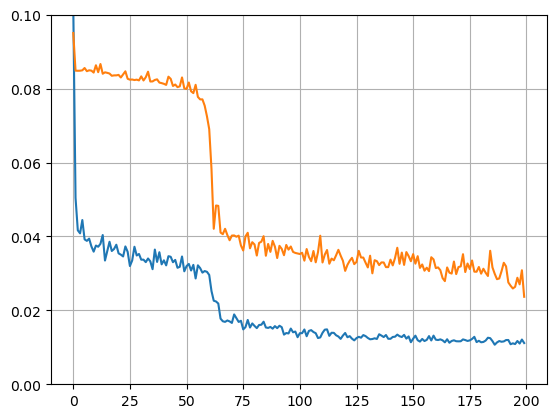

Bestof
1


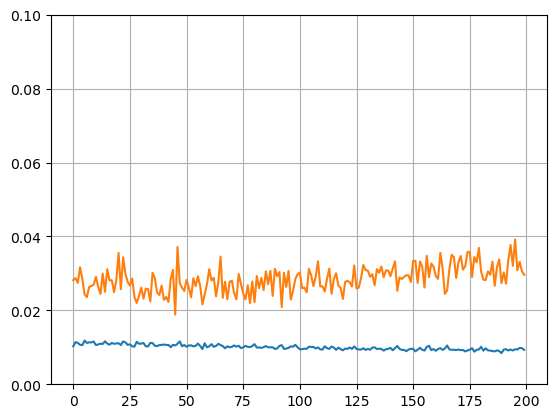

Bestof
2


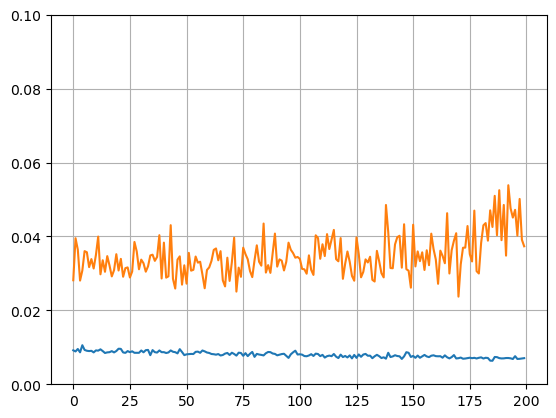

Bestof
3


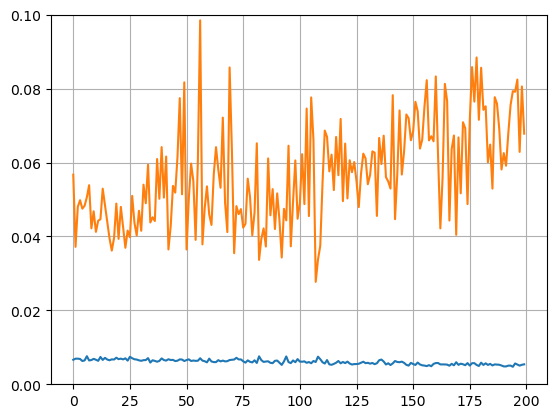

Bestof
4


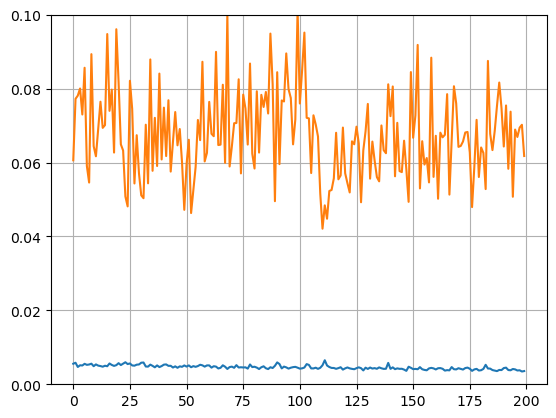

Bestof
5


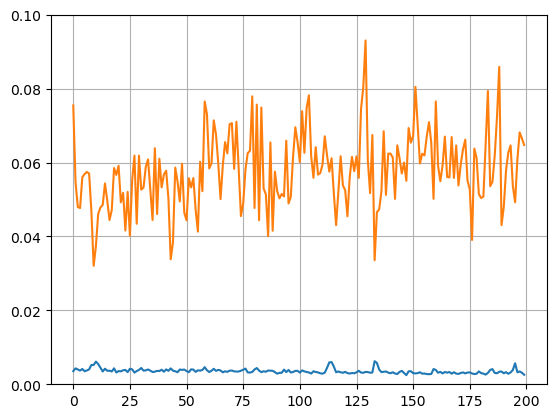

Bestof
6


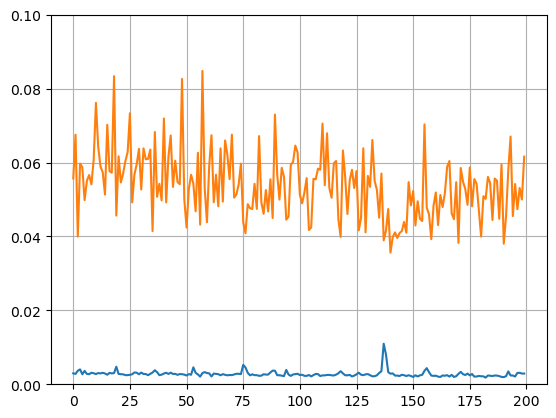

Bestof
7


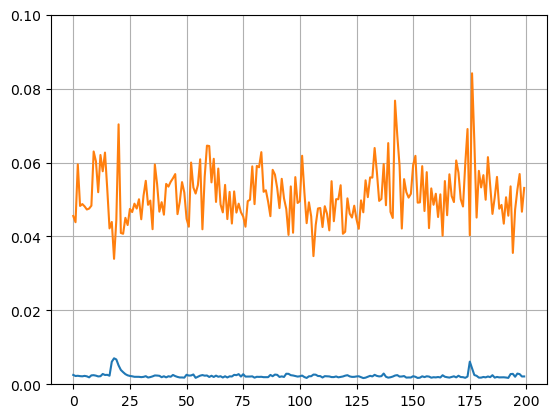

Bestof
8


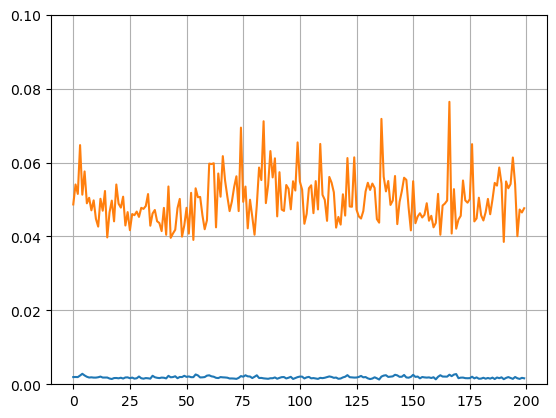

Bestof
9


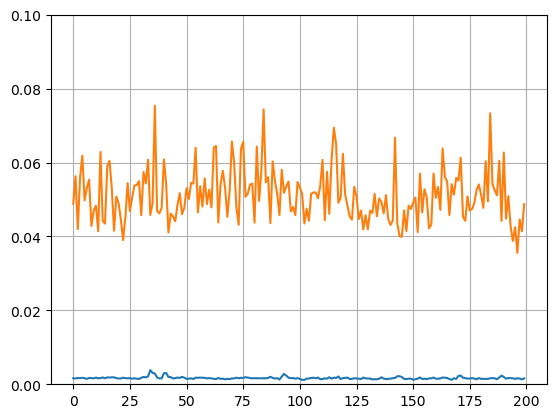

Bestof
10


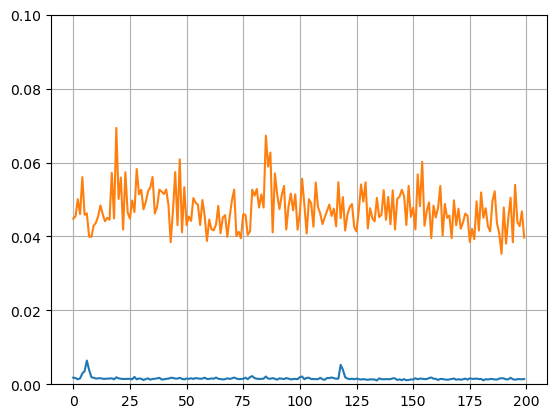

Bestof
11


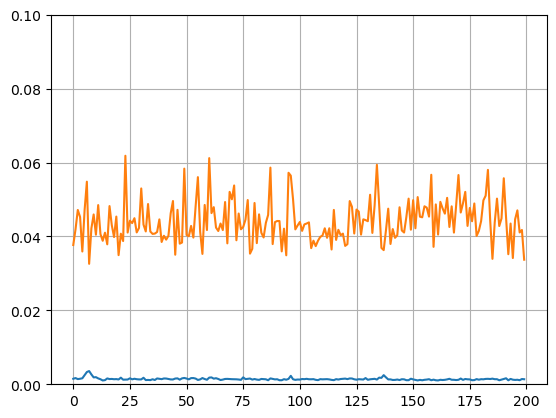

Bestof
12


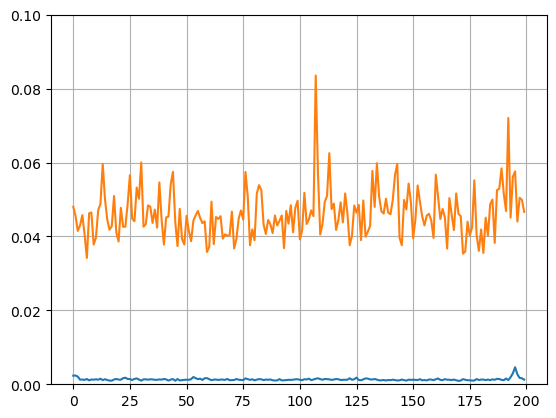

Bestof
13


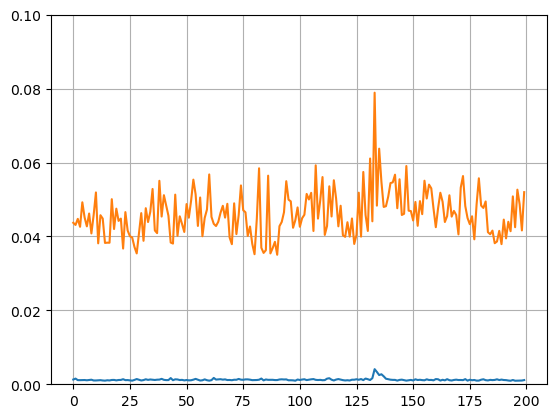

Bestof
14


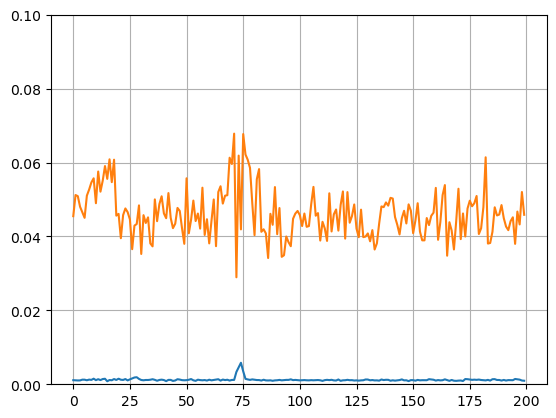

Bestof
15


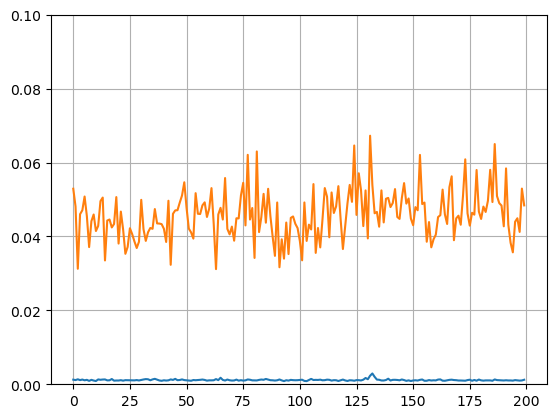

Bestof
16


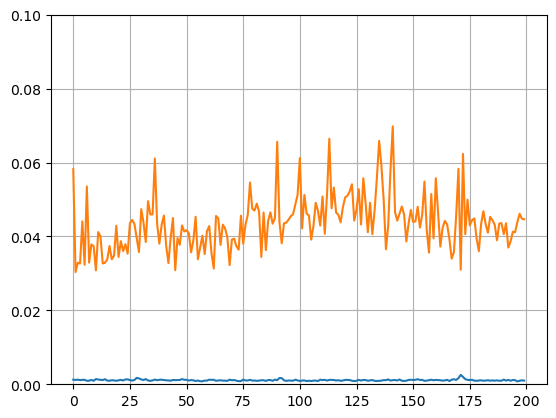

Bestof
17


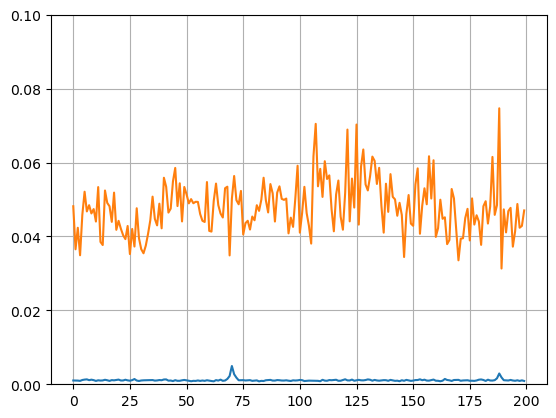

Bestof
18


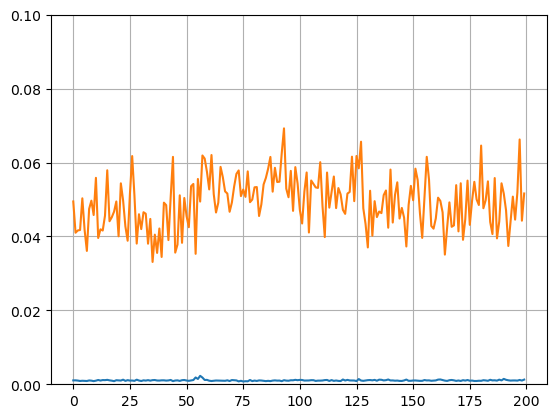

Bestof
19


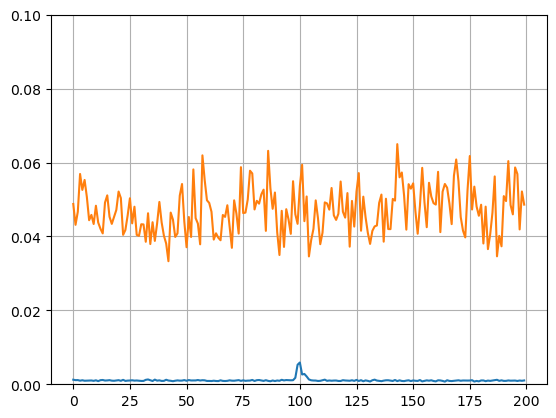

Bestof
20
Repetición
1


In [16]:
###FK1 RESIDUES

Bestof      = 20
Repes       = 1
batch_size  = 14
epochs      = 200

A_mse = []
Aval_mse = [] #val_mse

all_Fcast_FK_Val_train  = []
all_Fcast_FK_Val_val    = []
all_Fcast_FK_Test_train = []
all_Fcast_FK_Test_val   = []

#Modos, para pronóstico de filtro sma3 usar:
#mode = model_lstm(opt='adam')
#Modos, para pronóstico de residuos usar:
mode = model_lstm2(opt='adam')

Rep = 0

for run in range(0,Repes):
    FcastVal_train, FcastTest_train, FcastVal_val, FcastTest_val, all_mse, all_val_mse = Better_LSTM(X_train_FK, y_train_FK, X_val_FK, y_val_FK, Bestof, mode)
    
    all_Fcast_FK_Val_train.append(FcastVal_train[:])
    all_Fcast_FK_Test_train.append(FcastTest_train[:])
    all_Fcast_FK_Val_val.append(FcastVal_val[:])
    all_Fcast_FK_Test_val.append(FcastTest_val[:])
    Rep = Rep + 1
    print('Repetición')
    print(Rep)

In [17]:
###FK1 RESIDUES

### Average from the repetitions
avg_Fcast_FK_Val_train  = np.mean(all_Fcast_FK_Val_train, axis=0)
avg_Fcast_FK_Test_train = np.mean(all_Fcast_FK_Test_train, axis=0)
avg_Fcast_FK_Val_val    = np.mean(all_Fcast_FK_Val_val, axis=0)
avg_Fcast_FK_Test_val   = np.mean(all_Fcast_FK_Test_val, axis=0)

### Reshaping for desnormalizing
avg_Fcast_FK_Val_train  = np.array(avg_Fcast_FK_Val_train).reshape(-1,1)
avg_Fcast_FK_Test_train = np.array(avg_Fcast_FK_Test_train).reshape(-1,1)
avg_Fcast_FK_Val_val    = np.array(avg_Fcast_FK_Val_val).reshape(-1,1)
avg_Fcast_FK_Test_val   = np.array(avg_Fcast_FK_Test_val).reshape(-1,1)

### Desnormalizing
fc_val_train  = sc.inverse_transform(avg_Fcast_FK_Val_train)
fc_test_train = sc.inverse_transform(avg_Fcast_FK_Test_train)
fc_val_val    = sc.inverse_transform(avg_Fcast_FK_Val_val)
fc_test_val   = sc.inverse_transform(avg_Fcast_FK_Test_val)

Val_df        = pd.DataFrame(ResFK[lim_train:lim_train + Size_Val])
Val           = np.array(Val_df)
Test_df       = pd.DataFrame(ResFK[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test          = np.array(Test_df)

### Métricas de Desempeño
print('Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Val, fc_val_train)
print('MDA')
MDA = mda(Val, fc_val_train)
print('RMSE')
rmse = RMSE(Val, fc_val_train)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento')
print('MAPE')
Mape = MAPE(Test, fc_test_train)
print('MDA')
MDA = mda(Test, fc_test_train)
print('RMSE')
rmse = RMSE(Test, fc_test_train)
print(rmse[0])

print('Medidas de error del pronóstico de Validación según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Val, fc_val_val)
print('MDA')
MDA = mda(Val, fc_val_val)
print('RMSE')
rmse = RMSE(Val, fc_val_val)
print(rmse[0])

print('Medidas de error del pronóstico de Prueba según el mejor mse de validación')
print('MAPE')
Mape = MAPE(Test, fc_test_val)
print('MDA')
MDA = mda(Test, fc_test_val)
print('RMSE')
rmse = RMSE(Test, fc_test_val)
print(rmse[0])

Medidas de error del pronóstico de Validación según el mejor mse de entrenamiento
MAPE
105.70189226721244
MDA
65.85365853658537
RMSE
14930.559440487217
Medidas de error del pronóstico de Prueba según el mejor mse de entrenamiento
MAPE
29.146327604720312
MDA
65.0
RMSE
8352.018974351158
Medidas de error del pronóstico de Validación según el mejor mse de validación
MAPE
81.58751297541937
MDA
73.17073170731707
RMSE
10591.485306761726
Medidas de error del pronóstico de Prueba según el mejor mse de validación
MAPE
28.456718398484874
MDA
85.0
RMSE
7003.825095369824


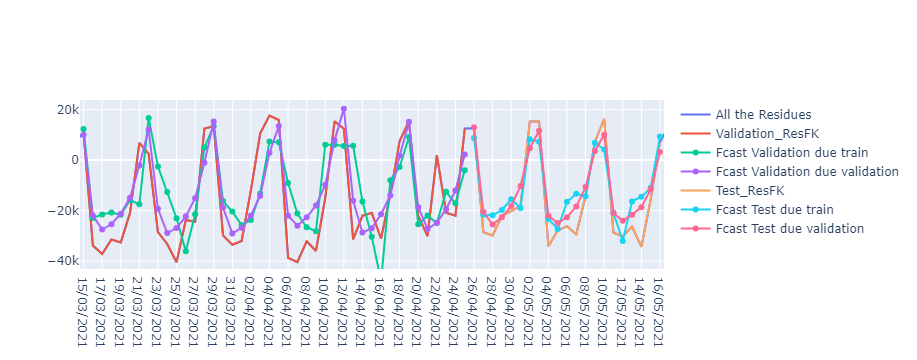

In [18]:
### RESFK
# Part 5 - Visualising the Forecast 
Fcast_df['ResFKValidation']          = pd.DataFrame(Val_df.values)
Fechas_validation_df                 = pd.DataFrame(Fechas[lim_train:lim_train + Size_Val])
Fcast_df['FechasValidation']         = pd.DataFrame(Fechas_validation_df.values)
Fcast_df['ResFcast_FK_Val_train']    = pd.DataFrame(fc_val_train)
Fcast_df['ResFcast_FK_Val_val']      = pd.DataFrame(fc_val_val)

Fcast_df['ResFKTest']                = pd.DataFrame(Test_df.values)
Fcast_df['ResFcast_FK_Test_train']   = pd.DataFrame(fc_test_train)
Fcast_df['ResFcast_FK_Test_val']     = pd.DataFrame(fc_test_val)
Fechas_test_df                       = pd.DataFrame(Fechas[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Fcast_df['FechasTest']               = pd.DataFrame(Fechas_test_df.values)

fig = go.Figure()
# Add traces

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['RFK'] ,
                        mode='lines', name='All the Residues'))

fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['ResFKValidation'],
                        mode='lines', name='Validation_ResFK'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['ResFcast_FK_Val_train'],
                        mode='lines+markers', name='Fcast Validation due train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['ResFcast_FK_Val_val'],
                        mode='lines+markers', name='Fcast Validation due validation'))

fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['ResFKTest'],
                        mode='lines', name='Test_ResFK'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['ResFcast_FK_Test_train'],
                        mode='lines+markers', name='Fcast Test due train'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['ResFcast_FK_Test_val'],
                        mode='lines+markers', name='Fcast Test due validation'))

fig.show()



Mape del Pronóstico Total
37.8695673689284
80.0
Promedio de la Presición de la Dirección
80.0
RMSE
28240.52073888275


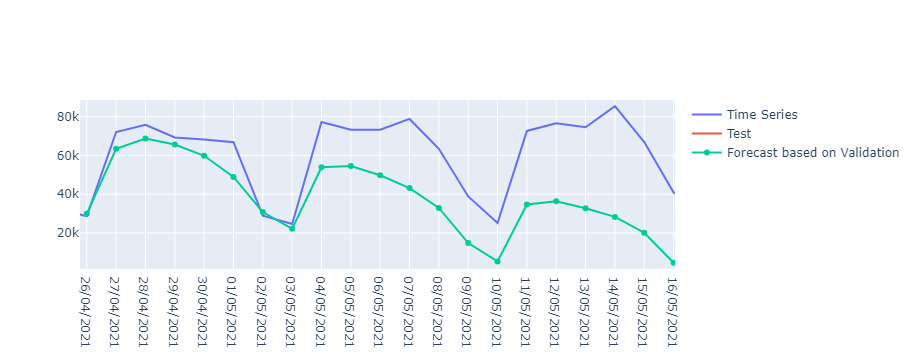

In [19]:
### RESFK

df_Total_Val    = Fcast_df['Fcast_FK_Test_val']   -  Fcast_df['ResFcast_FK_Test_val']
#df_Total_Train  = Fcast_df['Fcast_FK_Test_train'] -  Fcast_df['ResFcast_FK_Test_train']

TotalSuma_Val   = np.array(df_Total_Val)
#TotalSuma_Train = np.array(df_Total_Train)

#Fcast_df tiene el tamaño de validation, es necesario recortarlo para el cálculo de mda y rmse
TotalSuma_Val   = TotalSuma_Val[0:Steps_Fcast]
#TotalSuma_Train = TotalSuma_Train[0:Steps_Fcast]
#Reshaping
TotalSuma_Val   = np.reshape(TotalSuma_Val, (-1,1))
#TotalSuma_Train = np.reshape(TotalSuma_Train, (-1,1))

#Raw = np.array(Raw.values)
#Raw             = np.array(Raw)
#Raw             = np.reshape(Raw, (-1,1))
Test_df         = pd.DataFrame(Raw[lim_train + Size_Val:lim_train + Size_Val + Steps_Fcast])
Test            = np.array(Test_df)

print('Mape del Pronóstico Total')
#Mape_Train, Dif_Train  = MAPE(Test, TotalSuma_Train)
Mape_Val,   Dif_Val    = MAPE(Test, TotalSuma_Val)

#MDA_Train              = mda(Test, TotalSuma_Train)
MDA_Val                = mda(Test, TotalSuma_Val)

print('Promedio de la Presición de la Dirección')
#print(MDA_Train)
print(MDA_Val)

print('RMSE')
#rmse_Train = RMSE(Test, TotalSuma_Train)
rmse_Val   = RMSE(Test, TotalSuma_Val)
#print(rmse_Train[0])
print(rmse_Val[0])

#Fcast_df['Total_Train']          = pd.DataFrame(df_Total_Train)
Fcast_df['Final_FK']             = pd.DataFrame(df_Total_Val)
Fcast_df['Real']                 = pd.DataFrame(Test_df)

fig = go.Figure()
# Add traces

fig.add_trace(go.Scatter(x=COVID_Time_Series_df['FECHAS'] , y=COVID_Time_Series_df['Raw'], mode='lines', name='Time Series'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Validation_RES3'],mode='lines', name='Validation RES3'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES3_Val_train'], mode='lines+markers', name='Fcast RES3 Validation según train'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasValidation'], y=Fcast_df['Fcast_RES3_Val_val'], mode='lines+markers', name='Fcast RES3 Validation según validation'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Real'], mode='lines', name='Test'))
#fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Total_Train'], mode='lines+markers', name='Forecast based on training'))
fig.add_trace(go.Scatter(x=Fcast_df['FechasTest'], y=Fcast_df['Final_FK'], mode='lines+markers', name='Forecast based on Validation'))

fig.show()